In [1]:
# Importing python libraries :

import numpy as np
import pandas as pd
import time

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# import machine learning and stats libraries:
from scipy import stats
from scipy.stats import norm, skew
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

import sklearn
from sklearn import metrics
from sklearn.metrics import roc_curve, auc 
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import average_precision_score, precision_recall_curve

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, PowerTransformer, PolynomialFeatures

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, StratifiedKFold, StratifiedShuffleSplit, RepeatedKFold 

# For hyper-parameter tuning
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Logistic Regression
from sklearn.linear_model import Ridge, Lasso, LogisticRegression
from sklearn.linear_model import LogisticRegressionCV

# KNN
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier

# XGBoost
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
from xgboost.sklearn import XGBClassifier

# Random Forest
from sklearn.ensemble import RandomForestClassifier

# Decision Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

# SVM model
from sklearn.svm import SVC

# Classification algo metrics
from sklearn.metrics import roc_auc_score, auc, roc_curve, accuracy_score, recall_score

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN
  
#install scikit-optimize
#!pip install scikit-optimize
from skopt import BayesSearchCV

# install imblearn
#!conda install -c conda-forge imbalanced-learn
#!pip install imbalanced-learn==0.6.2

In [2]:
df = pd.read_csv('creditcard.csv') # importing the dataset from kaggle.
df.head(5) #checking the top 5 rows

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [3]:
df.tail(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0
284806,172792.0,-0.533413,-0.189733,0.703337,-0.506271,-0.012546,-0.649617,1.577006,-0.414650,0.486180,...,0.261057,0.643078,0.376777,0.008797,-0.473649,-0.818267,-0.002415,0.013649,217.00,0


In [4]:
# Data dimension
print("Data dimension     :",df.shape)
print("Data size          :",df.size)
print("Number of Row          :",len(df.index))
print("Number of Columns      :",len(df.columns))

Data dimension     : (284807, 31)
Data size          : 8829017
Number of Row          : 284807
Number of Columns      : 31


In [5]:
#checking numerical columns statistics
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.758702e-12,-8.252296e-13,-9.637438e-13,8.316234e-13,1.592013e-13,4.247308e-13,-3.050183e-13,8.692882e-14,-1.179710e-12,...,-3.406538e-13,-5.713357e-13,-9.725290e-13,1.464144e-12,-6.989090e-13,-5.615254e-13,3.332111e-12,-3.518885e-12,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


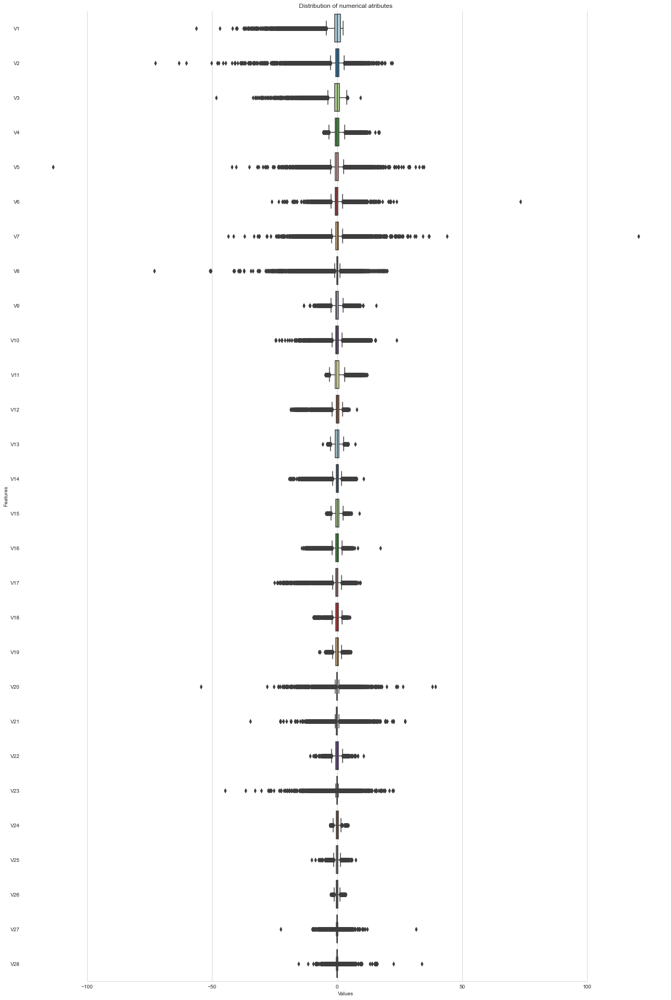

In [6]:
# Boxplot to understand the distribution of numerical attributes :

# Selecting only numerical feature from the dataframe:
numeric_features = df.select_dtypes(include=[np.number]).columns.tolist()

# Excluding BINARY target feature(Class) and Time variable as its not needed for transformation and Amount variable as its covered in previous plot: 
li_not_plot = ['Class', 'Time', 'Amount']
li_transform_num_feats = [c for c in list(numeric_features) if c not in li_not_plot]

sns.set_style("whitegrid")
f, ax = plt.subplots(figsize=(22,34))
# Using log scale:
#ax.set_xscale("log")
ax = sns.boxplot(data=df[li_transform_num_feats] , orient="h", palette="Paired")
ax.set(ylabel="Features")
ax.set(xlabel="Values")
ax.set(title="Distribution of numerical atributes")
sns.despine(trim=True,left=True)

In [7]:
classes=df['Class'].value_counts()
normal_share=classes[0]/df['Class'].count()*100
fraud_share=classes[1]/df['Class'].count()*100

print(normal_share)
print(fraud_share)

99.82725143693798
0.1727485630620034


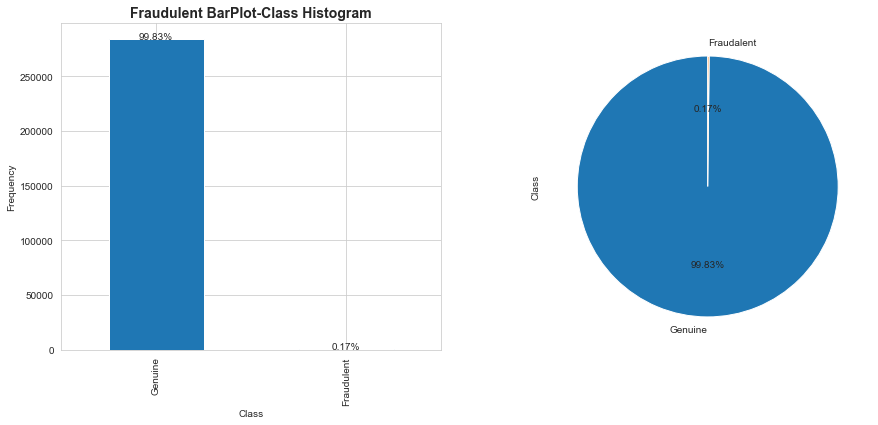

In [8]:
# Create a bar plot for the number and percentage of fraudulent vs non-fraudulent transcations
plt.figure(figsize=(15,6))

plt.subplot(121)
plt.title('Fraudulent BarPlot-Class Histogram', fontweight='bold',fontsize=14)
count_of_classes = pd.value_counts(df['Class'], sort = True).sort_index()
ax = count_of_classes.plot(kind = 'bar')
plt.xlabel("Class")
plt.ylabel("Frequency")
plt.xticks([0,1],["Genuine","Fraudulent"])

total = float(len(df))
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height*100/total),
            ha="center") 


plt.subplot(122)
labels = 'Genuine', 'Fraudalent'
df["Class"].value_counts().plot.pie(autopct = "%1.2f%%", labels=labels, startangle=90)
plt.show()

# Visualizing Time Distribution 

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:title={'center':'Distribution of Transaction Time'}, ylabel='Density'>

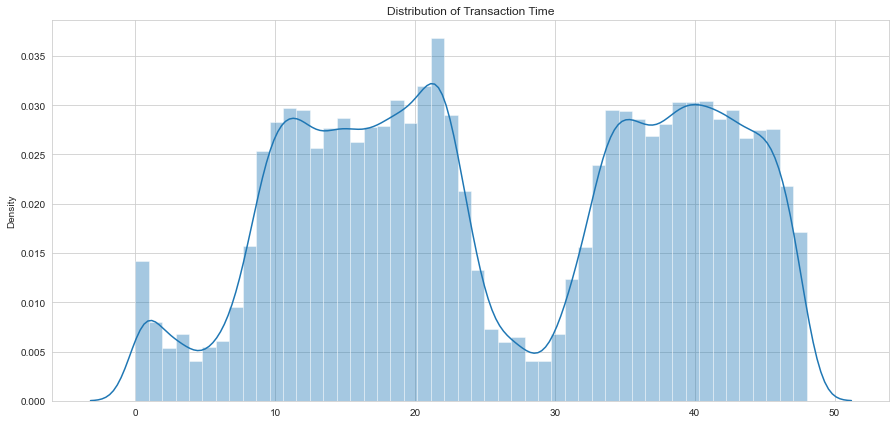

In [10]:
# Time Distribution plot for transactions 
plt.figure(figsize=(15,7))

plt.title('Distribution of Transaction Time')
sns.distplot(df['Time'].values/(60*60))

# Visualizing Amount Distribution

Text(0, 0.5, 'Density')

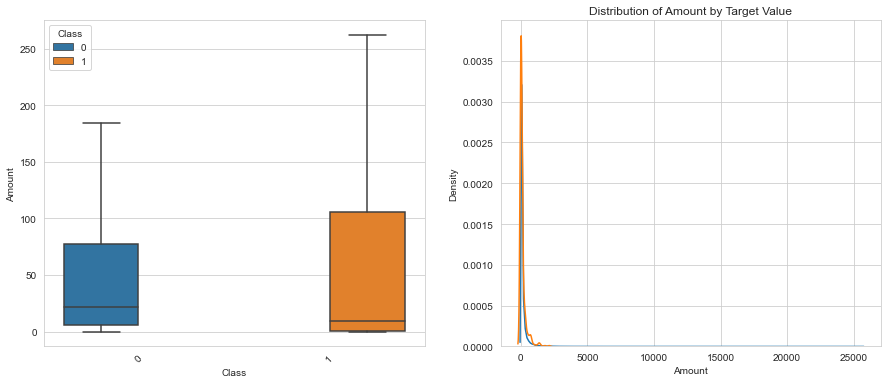

In [12]:
# Box Plot of amount for both classes
plt.figure(figsize = (15, 6))
plt.subplot(121)
a = sns.boxplot(x = 'Class', y = 'Amount',hue='Class', data = df, showfliers=False) 
plt.setp(a.get_xticklabels(), rotation=45)

plt.subplot(122)
# KDE plot to visualize the distribution of Amount for both the classes
plt.rcParams['figure.figsize'] = [10,6]
sns.kdeplot(df.loc[df['Class'] == 0, 'Amount'], label = 'Non Fraud')
sns.kdeplot(df.loc[df['Class'] == 1, 'Amount'], label = 'Fraud')
plt.title('Distribution of Amount by Target Value')
plt.xlabel('Amount')
plt.ylabel('Density')

# Visualizing correlation

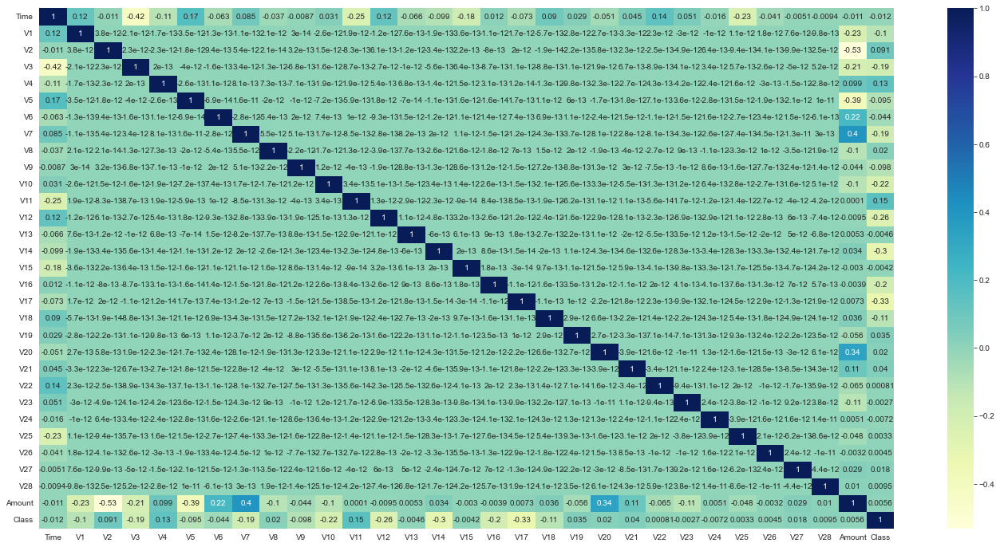

In [14]:
plt.figure(figsize=(24, 12))
sns.heatmap(df.corr(), cmap="YlGnBu", annot=True)
plt.show()

In [15]:
#Check the fraud/Non_Fraud related records
df['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [16]:
#Check the percentage of fraud/Non_Fraud related records
df['Class'].value_counts(normalize=True)*100

0    99.827251
1     0.172749
Name: Class, dtype: float64

In [17]:
print('The percentage without churn prediction is ', round(df['Class'].value_counts()[0]/len(df) * 100,2), '% of the dataset')
print('The percentage with churn prediction is ', round(df['Class'].value_counts()[1]/len(df) * 100,2), '% of the dataset')
print('The ratio of imbalance is', round(df['Class'].value_counts()[1]/df['Class'].value_counts()[0] * 100,2))

The percentage without churn prediction is  99.83 % of the dataset
The percentage with churn prediction is  0.17 % of the dataset
The ratio of imbalance is 0.17


In [18]:
# So we have 492 fraudalent transactions out of 284807 total credit card transactions.

In [19]:
# Train - Test Split

In [20]:
y = df['Class']
X = df.drop(['Class'], axis=1)
X.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99


In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, test_size=0.20)

In [22]:
print(np.sum(y))
print(np.sum(y_train))
print(np.sum(y_test))

492
396
96


# Handling Data Skewness

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

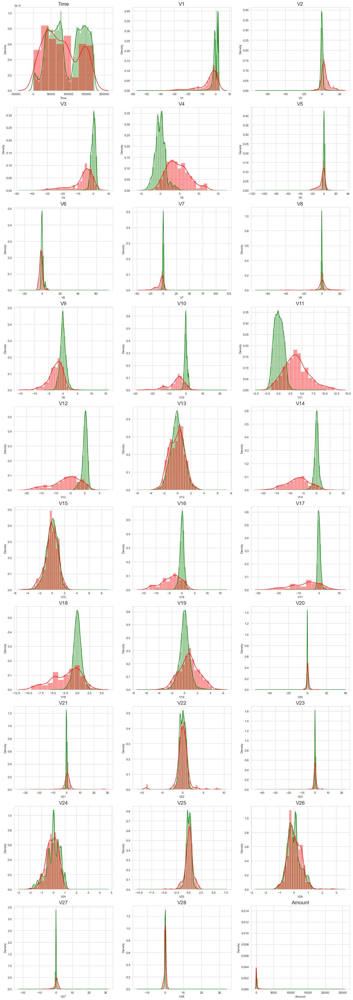

In [24]:
# plot the histogram of a variable from the dataset to see the skewness
cols = list(df.columns.values)
cols.remove('Class')
normal_records = df.Class == 0
fraud_records = df.Class == 1

plt.figure(figsize=(20, 60))
for n, col in enumerate(cols):
    plt.subplot(10,3,n+1)
    sns.distplot(df[col][normal_records], color='green')
    sns.distplot(df[col][fraud_records], color='red')
    plt.title(col, fontsize=17)
plt.show()

We can see most of the variables have outliers and the distribution is not normal.

Power Transformer package present in the preprocessing library provided by sklearn to make distribution more gaussian

In [27]:
# - Apply : preprocessing.PowerTransformer(copy=False) to fit & transform the train & test data
pt = PowerTransformer()
pt.fit(X_train)                       ## Fit the PT on training data
X_train_pt = pt.transform(X_train)    ## Then apply on all data
X_test_pt = pt.transform(X_test)

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

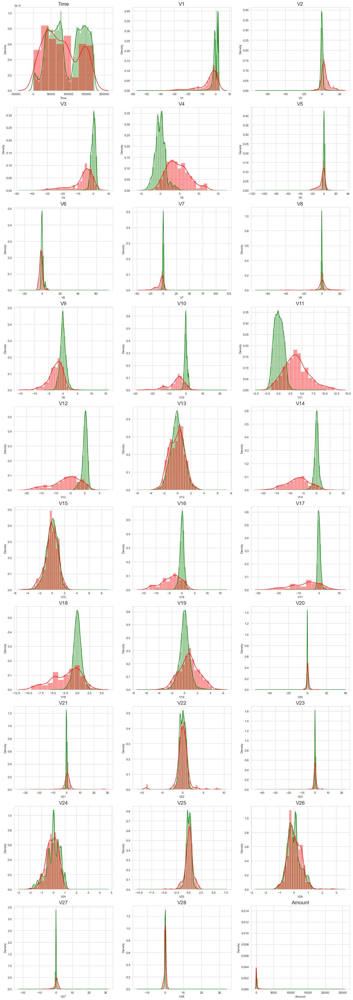

In [28]:
# plot the histogram of a variable from the dataset again to see the result 
cols = list(df.columns.values)
cols.remove('Class')
normal_records = df.Class == 0
fraud_records = df.Class == 1

plt.figure(figsize=(20, 60))
for n, col in enumerate(cols):
    plt.subplot(10,3,n+1)
    sns.distplot(df[col][normal_records], color='green')
    sns.distplot(df[col][fraud_records], color='red')
    plt.title(col, fontsize=17)
plt.show()

In [29]:
# After using Power transformer on the dataset, the dataset looks more Gaussian. We are good to build model on this dataset now

In [30]:
# Create a dataframe to store results
df_Results = pd.DataFrame(columns=['Model','Data_Imbalance_Handling','Accuracy on Test Dataset','Recall on Test Dataset','roc_value on Test Dataset','threshold'])

In [31]:
# function to view model results - confusion matrix and classification report
def plot_model_results(y_test, y_pred_model):
    fig = plt.figure(figsize=(18, 7))
    ax1 = fig.add_subplot(121)
    
    # Plot Confusion matrix
    cf_matrix = confusion_matrix(y_test, y_pred_model)
    group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='PiYG', linewidth=0.3,
    xticklabels = ["Non-Fraudalent", "Fraudalent"] ,
    yticklabels = ["Non-Fraudalent", "Fraudalent"] )
    plt.title('Confusion Matrix of Test Dataset' , fontweight ="bold")
    plt.ylabel('True labels')
    plt.xlabel('Predicted labels')
    
    # Print classification Report
    ax2 = fig.add_subplot(122)
    # convert a classification report to a pandas Dataframe is by simply having the report returned as a dict
    report = classification_report(y_test, y_pred_model, output_dict=True)
    df = pd.DataFrame(report).transpose()
    ax2.set_axis_off() 
    font_size=12
    class_report_table = ax2.table(cellText = df.values, rowLabels = df.index, colLabels = df.columns, rowColours =["palegreen"] * 10, colColours =["palegreen"] * 10,  loc ='right')         
    class_report_table.auto_set_font_size(False)
    class_report_table.set_fontsize(font_size)
    class_report_table.auto_set_column_width(col=list(range(len(df.columns)))) # Provide integer list of columns to adjust
    ax2.set_title('Classification Report on Test Dataset', fontweight ="bold", loc="right")    
    plt.show()  

In [32]:
# function to calculate and view model evaluation metrics - ROC curve and Evaluation metrics such as Area under curve score, accuracy and recall
def plot_evaluation_metrics(y_test_model, y_pred_model, y_pred_prob, DataImbalance, model):
    accuracy = round(accuracy_score(y_pred=y_pred_model, y_true=y_test_model),4)
    recall = round(recall_score(y_pred_model, y_test_model),4)
    roc_value = round(roc_auc_score(y_test_model, y_pred_prob),4)
    fpr, tpr, thresholds = roc_curve(y_test_model, y_pred_prob)
    threshold = round(thresholds[np.argmax(tpr-fpr)],4)
    roc_auc = auc(fpr, tpr)
    
    fig = plt.figure(figsize=(18, 7))
    # AUC-ROC Curve 
    ax1 = fig.add_subplot(121)
    plt.plot(fpr, tpr, label='ROC curve for test dataset(area = %0.2f)' % roc_auc )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic', fontweight ="bold")
    plt.legend(loc="lower right")
     
    # Print Evaluation metrics
    ax2 = fig.add_subplot(122)
    ax2.axis('off')
    font_size=12
    
    eval_df = pd.DataFrame({'Data_Imbalance_Handling': DataImbalance,'Model': model,'Accuracy on Test Dataset': accuracy, 'Recall on Test Dataset':recall, 'roc_value on Test Dataset': roc_value,'threshold': threshold}, index=[0])
    df = eval_df.transpose()
    ax2.axis('tight')
    metric_table = ax2.table(cellText = df.values, rowLabels = df.index, colLabels = df.columns, rowColours =["palegreen"] * 10, colColours =["palegreen"] * 10,  loc ='right')         
    metric_table.auto_set_column_width(col=list(range(len(eval_df.columns)))) # Provide integer list of columns to adjust
    metric_table.auto_set_font_size(False)
    metric_table.set_fontsize(font_size)
    ax2.set_title('Evaluation Metrics on Test Dataset', fontweight ="bold", loc="right")    
    
    plt.show()  
    
    return(eval_df)

In [33]:
# function to build Logistic regression model
def buildAndRunLogisticModels(df_Results, DataImbalance, X_train,y_train, X_test, y_test ): 
    start_time = time.time()
    num_C = list(np.power(10.0, np.arange(-10, 10)))
    cv_num = KFold(n_splits=10, shuffle=True, random_state=42)
    
    searchCV_l2 = LogisticRegressionCV(Cs= num_C, penalty='l2', scoring='roc_auc', cv=cv_num, random_state=42, max_iter=10000, fit_intercept=True, solver='newton-cg', tol=10)
    searchCV_l2.fit(X_train, y_train)
    print("Parameters for L2 regularisations: ")
    print(searchCV_l2.coef_)
    print(searchCV_l2.intercept_)  
    # find predicted values
    y_pred_l2 = searchCV_l2.predict(X_test)
    # Find predicted probabilities
    y_pred_probs_l2 = searchCV_l2.predict_proba(X_test)[:,1] 
    plot_model_results(y_test, y_pred_l2) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred_l2, y_pred_probs_l2, DataImbalance, "Logistic Regression with L2 Regularization") # Plot ROC curve and Evaluation metrics
    df_Results = pd.concat([df_Results, eval_df])
    l2_time = time.time()
    print("Time Taken by Logistic Regression/L2 RegModel: --- %s seconds ---" % (l2_time - start_time))

    searchCV_l1 = LogisticRegressionCV(Cs=num_C, penalty='l1', scoring='roc_auc', cv=cv_num, random_state=42, max_iter=10000, fit_intercept=True, solver='liblinear', tol=10)
    searchCV_l1.fit(X_train, y_train)
    print("Parameters for l1 regularisations: ")
    print(searchCV_l1.coef_)
    print(searchCV_l1.intercept_) 
    # find predicted values using l1 reg model
    y_pred_l1 = searchCV_l1.predict(X_test)
    # Find predicted probabilities
    y_pred_probs_l1 = searchCV_l1.predict_proba(X_test)[:,1] 
        
    plot_model_results(y_test, y_pred_l1) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred_l1, y_pred_probs_l1, DataImbalance, "Logistic Regression with L1 Regularization")
    df_Results = pd.concat([df_Results, eval_df])
    l1_time = time.time()
    print("Time Taken by Logistic Regression/L1 RegModel: --- %s seconds ---" % (l1_time - start_time))

    return df_Results

In [34]:
# function to build KNN model
def buildAndRunKNNModels(df_Results,DataImbalance, X_train,y_train, X_test, y_test ):
    #create KNN model and fit the model with train dataset
    start_time = time.time()
    knn = KNeighborsClassifier(n_neighbors = 5,n_jobs=16)
    knn.fit(X_train,y_train)

    # Predict on test dataset
    y_pred = knn.predict(X_test)
    knn_probs = knn.predict_proba(X_test)[:, 1]

    plot_model_results(y_test, y_pred) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred, knn_probs, DataImbalance, "KNN") # Plot ROC curve and Evaluation metrics
    df_Results = pd.concat([df_Results, eval_df])
    
    print("Time Taken by KNN Model: --- %s seconds ---" % (time.time() - start_time))
    return df_Results

In [35]:
# function to build SVM model
def buildAndRunSVMModels(df_Results, DataImbalance, X_train,y_train, X_test, y_test ):
    #Evaluate SVM model with sigmoid kernel  model
    start_time = time.time()
    clf = SVC(kernel='sigmoid', random_state=42)
    clf.fit(X_train,y_train)
    y_pred_SVM = clf.predict(X_test)

    # Run classifier
    classifier = SVC(kernel='sigmoid' , probability=True)
    svm_probs = classifier.fit(X_train, y_train).predict_proba(X_test)[:, 1]

    plot_model_results(y_test, y_pred_SVM) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred_SVM, svm_probs, DataImbalance, "SVM") # Plot ROC curve and Evaluation metrics
    df_Results = pd.concat([df_Results, eval_df])
    
    print("Time Taken by SVM Model: --- %s seconds ---" % (time.time() - start_time))
    return df_Results

In [36]:
# function to build Decision Tree model
def buildAndRunTreeModels(df_Results, DataImbalance, X_train,y_train, X_test, y_test ):
    # Evaluate Decision Tree model with 'gini' & 'entropy'
    criteria = ['gini', 'entropy'] 
    scores = {} 

    for c in criteria: 
        start_time = time.time()
        dt = DecisionTreeClassifier(criterion = c, random_state=42) 
        dt.fit(X_train, y_train) 
        y_pred = dt.predict(X_test)
        test_score = dt.score(X_test, y_test) 
        tree_preds = dt.predict_proba(X_test)[:, 1]
        
        plot_model_results(y_test, y_pred) # plot confusion matrix and classification report
        eval_df = plot_evaluation_metrics(y_test, y_pred, tree_preds, DataImbalance, "Tree model with {0} criteria".format(c)) # Plot ROC curve and Evaluation metrics
        df_Results = pd.concat([df_Results, eval_df])
        
        print("Time Taken by Tree Model with %s criteria: --- %s seconds ---" % (c, time.time() - start_time))
    return df_Results

In [37]:
# function to build Random Forest model
def buildAndRunRandomForestModels(df_Results, DataImbalance, X_train,y_train, X_test, y_test ):
    start_time = time.time()
    # Create the model with 100 trees
    RF_model = RandomForestClassifier(n_estimators=100, bootstrap = True, max_features = 'sqrt', random_state=42)
    # Fit on training data
    RF_model.fit(X_train, y_train)
    y_pred = RF_model.predict(X_test)

    # Actual class predictions
    rf_predictions = RF_model.predict(X_test)

    # Probabilities for each class
    rf_probs = RF_model.predict_proba(X_test)[:, 1]

    plot_model_results(y_test, y_pred) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred, rf_probs, DataImbalance, "Random Forest") # Plot ROC curve and Evaluation metrics
    df_Results = pd.concat([df_Results, eval_df])
    
    print("Time Taken by Random Forest Model: --- %s seconds ---" % (time.time() - start_time))
    return df_Results

In [38]:
# function to build XGBoost model
def buildAndRunXGBoostModels(df_Results, DataImbalance,X_train,y_train, X_test, y_test ):
    start_time = time.time()
    # fit model no training data
    XGBmodel = XGBClassifier(random_state=42)
    XGBmodel.fit(X_train, y_train)
    y_pred = XGBmodel.predict(X_test)

    # Probabilities for each class
    XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

    plot_model_results(y_test, y_pred) # plot confusion matrix and classification report
    eval_df = plot_evaluation_metrics(y_test, y_pred, XGB_probs, DataImbalance, "XGBoost") # Plot ROC curve and Evaluation metrics
    df_Results = pd.concat([df_Results, eval_df])
    
    print("Time Taken by XGBoost Model: --- %s seconds ---" % (time.time() - start_time))
    return df_Results

In [39]:
# Model building on imbalanced dataset
# We will feed the raw data(imbalanced) which is power transformed to below models:

#1. Logistic Regression with L2 Regularisation 
#2. Logistic Regression with L1 Regularisation 
#3. KNN 4. Decision tree model with Gini criteria 
#5. Decision tree model with Entropy criteria 
#6. Random Forest 
#7. XGBoost 
#8. SVM Model

Logistic Regression with L1 And L2 Regularisation
Parameters for L2 regularisations: 
[[-0.00194767 -0.09173247 -0.07064676 -0.28672716  0.54896375  0.02827695
   0.01273933 -0.06571591 -0.2043899  -0.19165046 -0.20383879  0.16935276
  -0.48321457 -0.12616652 -0.67528121 -0.07674234 -0.17871867 -0.08542594
   0.0377559  -0.03527795 -0.02265027  0.10384995  0.10023313 -0.03182686
  -0.02940319  0.00998389  0.00807192 -0.0463887  -0.02352787  0.02064147]]
[-8.05909755]


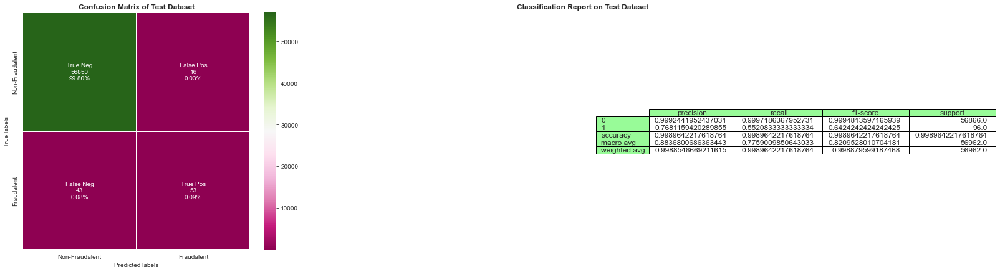

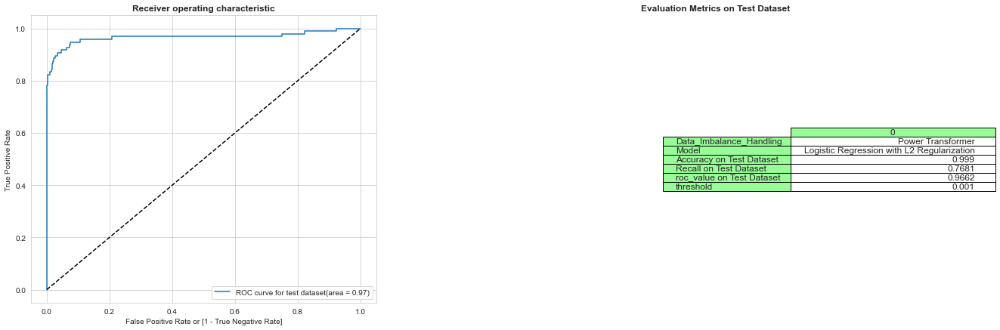

Time Taken by Logistic Regression/L2 RegModel: --- 69.12279200553894 seconds ---
Parameters for l1 regularisations: 
[[-0.00027686 -0.04871396  0.04364169 -0.13035737  0.13125569 -0.03277023
  -0.01866639 -0.08758435 -0.09496046 -0.07681529 -0.16932505  0.16909899
  -0.22138107 -0.01542652 -0.26133969 -0.012437   -0.14151455 -0.14637973
  -0.04182683  0.00721195  0.00279668  0.02444333  0.01533244 -0.00280684
  -0.01410303 -0.00044011  0.0051277  -0.00367604 -0.00455808 -0.00482798]]
[-5.10829272]


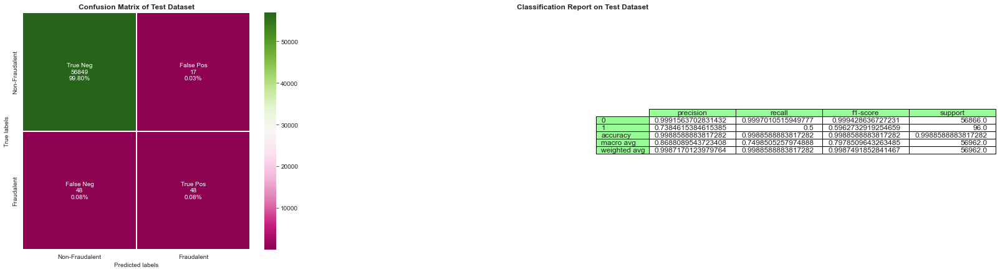

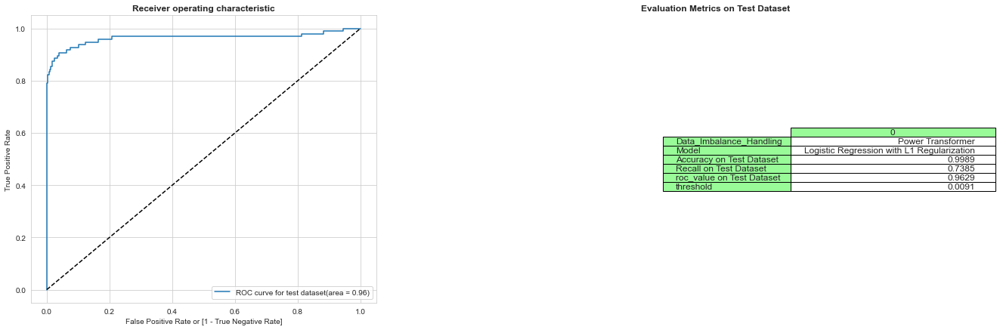

Time Taken by Logistic Regression/L1 RegModel: --- 171.46182131767273 seconds ---


In [40]:
# Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

KNN Model


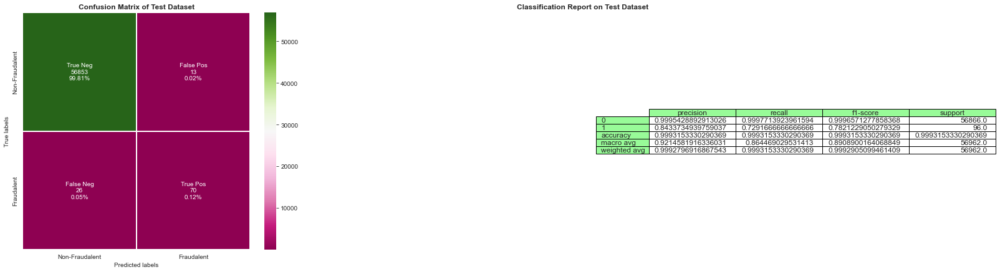

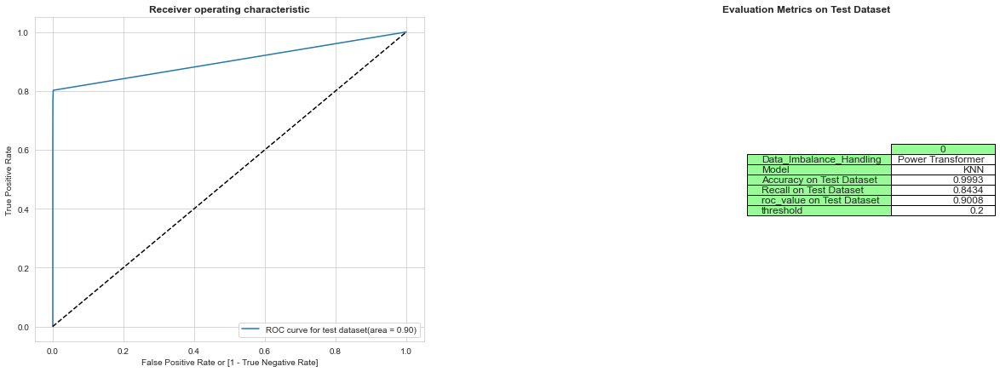

Time Taken by KNN Model: --- 1286.123098373413 seconds ---


In [41]:
# Run KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

Decision Tree Models with  'gini' & 'entropy' criteria


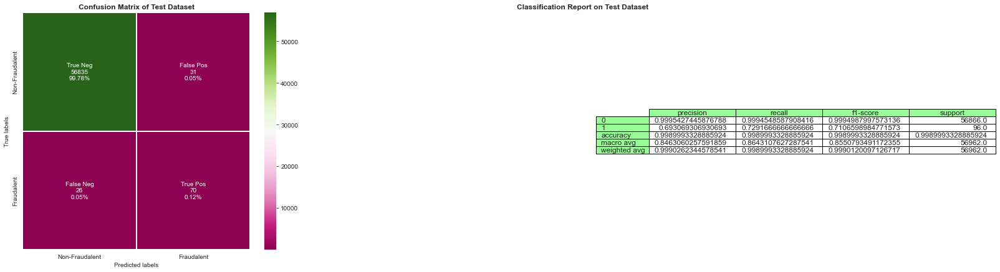

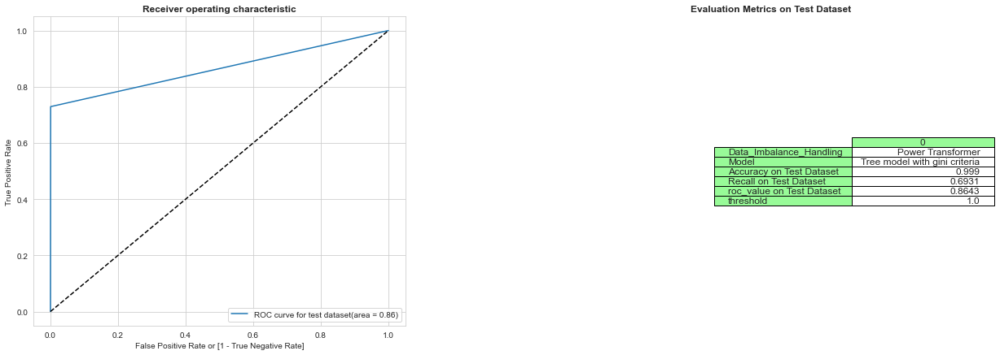

Time Taken by Tree Model with gini criteria: --- 29.4756817817688 seconds ---


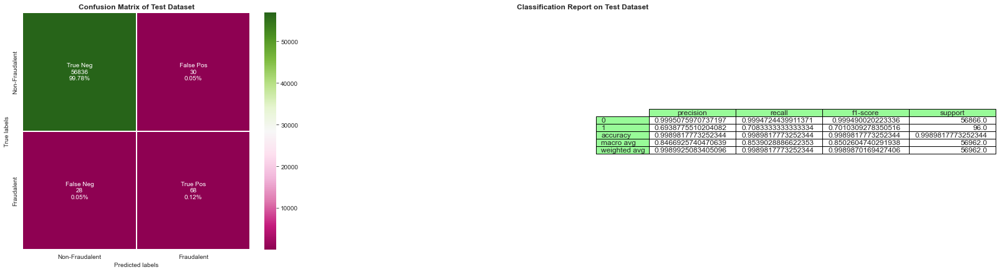

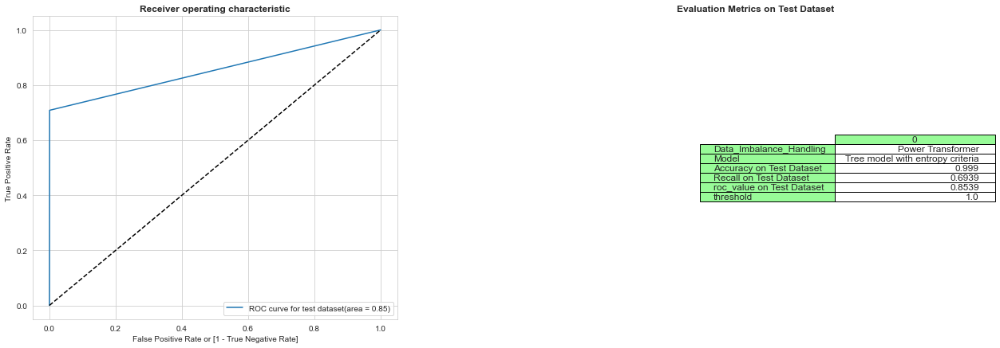

Time Taken by Tree Model with entropy criteria: --- 21.691554307937622 seconds ---


In [42]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

Random Forest Model


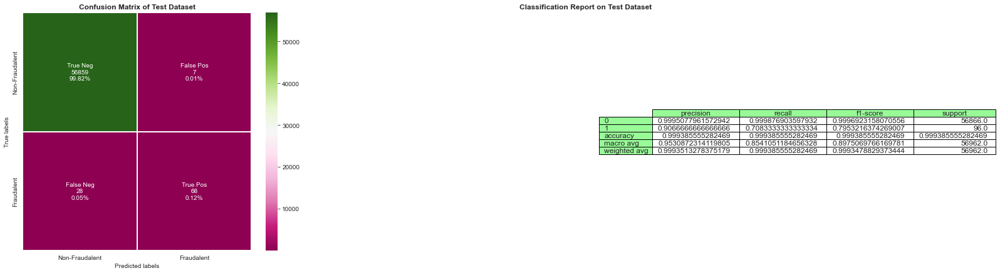

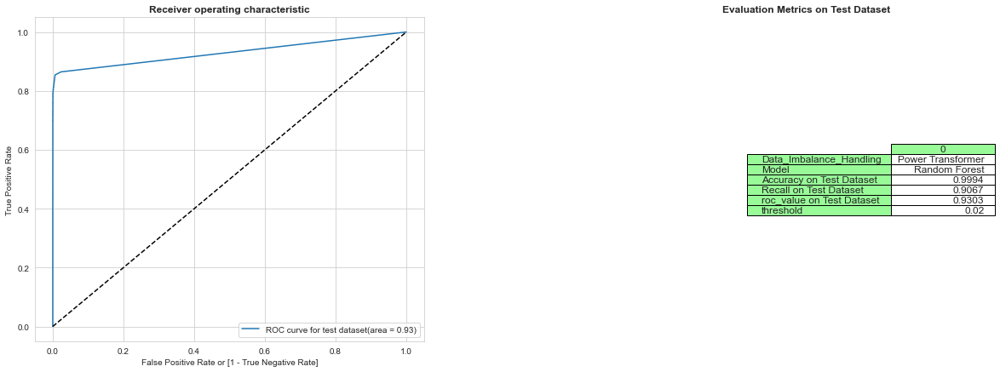

Time Taken by Random Forest Model: --- 324.67254972457886 seconds ---


In [43]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

XGBoost Model


C:\Users\User\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:06:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


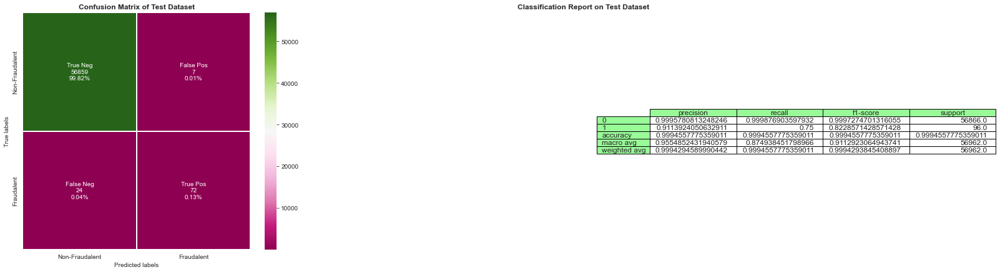

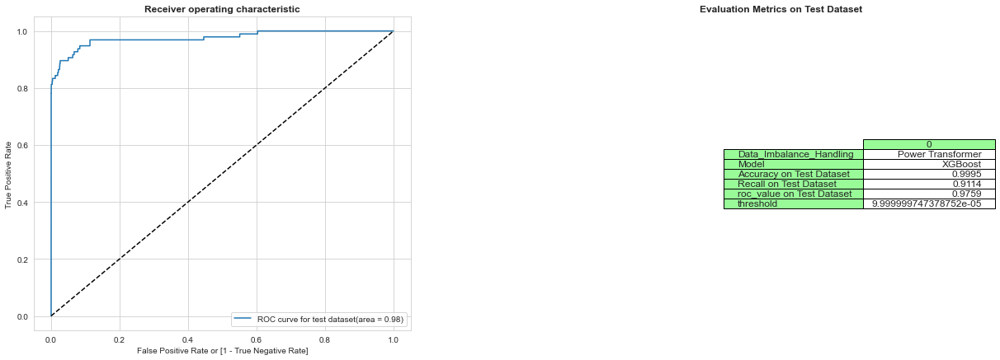

Time Taken by XGBoost Model: --- 114.44065237045288 seconds ---


In [44]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

SVM Model with Sigmoid Kernel


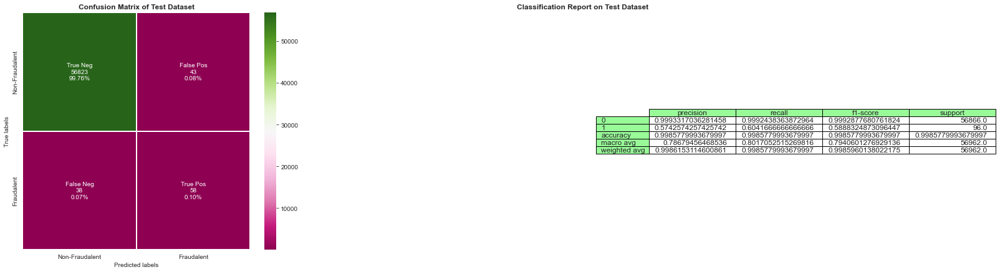

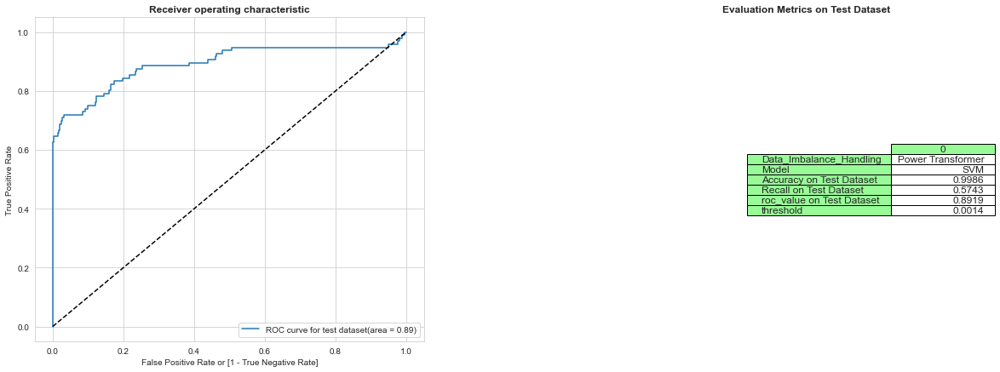

Time Taken by SVM Model: --- 120.5104296207428 seconds ---


In [45]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
df_Results = buildAndRunSVMModels(df_Results,"Power Transformer",X_train_pt,y_train, X_test_pt, y_test)

In [46]:
df_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7681,0.9662,0.0010
0,Logistic Regression with L1 Regularization,Power Transformer,0.9989,0.7385,0.9629,0.0091
0,KNN,Power Transformer,0.9993,0.8434,0.9008,0.2000
0,Tree model with gini criteria,Power Transformer,0.9990,0.6931,0.8643,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9990,0.6939,0.8539,1.0000
0,Random Forest,Power Transformer,0.9994,0.9067,0.9303,0.0200
0,XGBoost,Power Transformer,0.9995,0.9114,0.9759,0.0001
0,SVM,Power Transformer,0.9986,0.5743,0.8919,0.0014


# Model building on imbalanced dataset created by cross validation with RepeatedKFold

We will feed the raw data(imbalanced) which is created by cross validation with RepeatedKFold to below models:
1. Logistic Regression with L2 Regularisation 
2. Logistic Regression with L1 Regularisation 
3. KNN 
4. Decision tree model with Gini criteria 
5. Decision tree model with Entropy criteria 
6. Random Forest 
7. XGBoost 
8. SVM Model

In [48]:
# Lets perfrom RepeatedKFold and check the results
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=None)
# X is the feature set and y is the target
for train_index, test_index in rkf.split(X,y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_cv, X_test_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_cv, y_test_cv = y.iloc[train_index], y.iloc[test_index]

TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [    11     14     22 ... 284795 284796 284803]
TRAIN: [     0      1      2 ... 284800 284801 284803] TEST: [     3      7     18 ... 284804 284805 284806]
TRAIN: [     1      2      3 ... 284804 284805 284806] TEST: [     0      5      8 ... 284786 284789 284801]
TRAIN: [     0      2      3 ... 284804 284805 284806] TEST: [     1      4     12 ... 284791 284793 284800]
TRAIN: [     0      1      3 ... 284804 284805 284806] TEST: [     2      6      9 ... 284792 284798 284799]
TRAIN: [     0      1      3 ... 284802 284803 284804] TEST: [     2      5      7 ... 284794 284805 284806]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [     3     27     35 ... 284792 284798 284800]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [     4      6      9 ... 284796 284797 284801]
TRAIN: [     2      3      4 ... 284803 284805 284806] TEST: [     0      1     20 ... 284793 284802 284804]
TRAIN: [     0     

Logistic Regression with L1 And L2 Regularisation


C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line searc

Parameters for L2 regularisations: 
[[ 4.49303317e-07  6.50879278e-03  5.04983238e-02 -7.14948255e-02
   2.34596816e-01  8.47929925e-02 -4.11035307e-02 -2.99226342e-02
  -1.18713179e-01 -8.57495493e-02 -1.74746990e-01  1.38129319e-01
  -1.99342987e-01 -3.63382013e-02 -3.72211720e-01 -1.31945481e-02
  -1.03147338e-01 -9.10288210e-02 -1.03646998e-02  5.89181733e-03
  -1.05626843e-02  5.16634874e-02  3.13450893e-02 -8.49592732e-03
  -1.04633466e-02 -1.09152686e-02  8.63826799e-03 -1.87517496e-02
  -1.23088307e-05  3.32194584e-04]]
[-7.41934472]


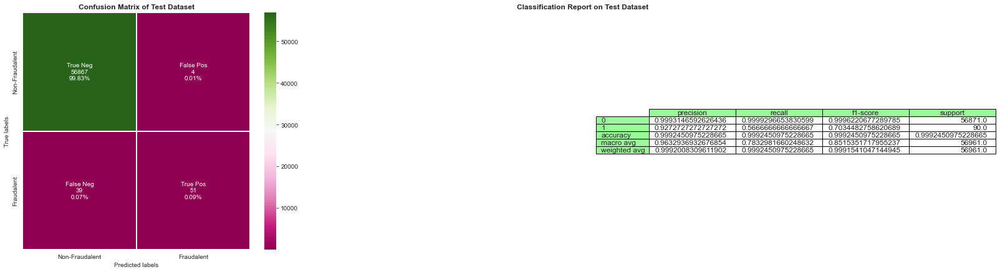

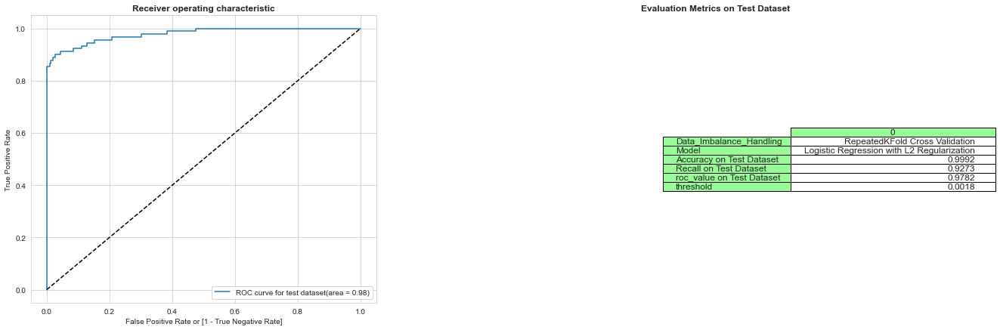

Time Taken by Logistic Regression/L2 RegModel: --- 925.5409405231476 seconds ---
Parameters for l1 regularisations: 
[[-1.69325440e-05  1.52832641e-02 -1.33308140e-01 -2.41737315e-01
   4.40760265e-02  1.39188532e-03 -3.60477481e-03  1.50638260e-01
  -8.09764910e-02 -8.89733062e-02 -1.37522502e-01 -7.78145273e-02
  -7.28012729e-02 -8.53313678e-02 -3.52834281e-01 -1.91861892e-01
  -1.24364322e-01 -1.93507879e-01  3.62095700e-02  4.98048871e-03
   1.65574240e-01  1.17077538e-01  1.08689685e-01 -5.63552314e-03
  -2.33952321e-02 -4.33506954e-01 -1.13357543e-02 -2.48261910e-02
   6.04757636e-02 -2.10917191e-03]]
[-3.31436981]


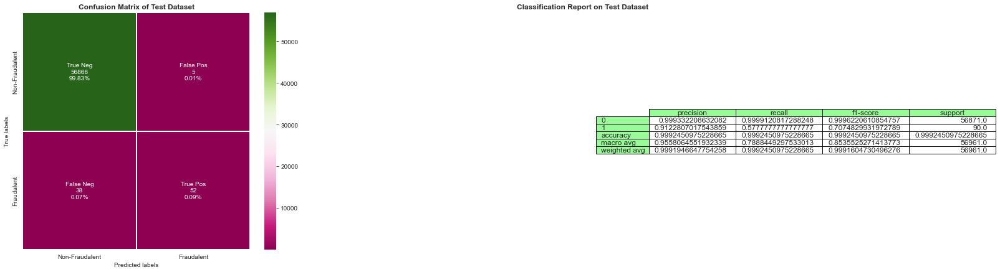

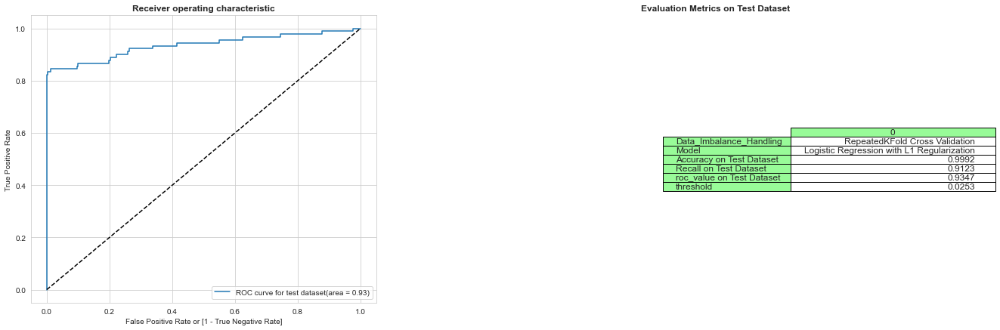

Time Taken by Logistic Regression/L1 RegModel: --- 1066.18638920784 seconds ---


In [49]:
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results,"RepeatedKFold Cross Validation", X_train_cv,y_train_cv, X_test_cv, y_test_cv)

KNN Model


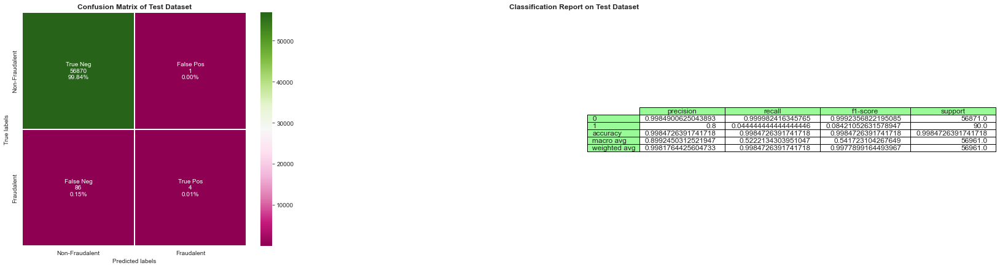

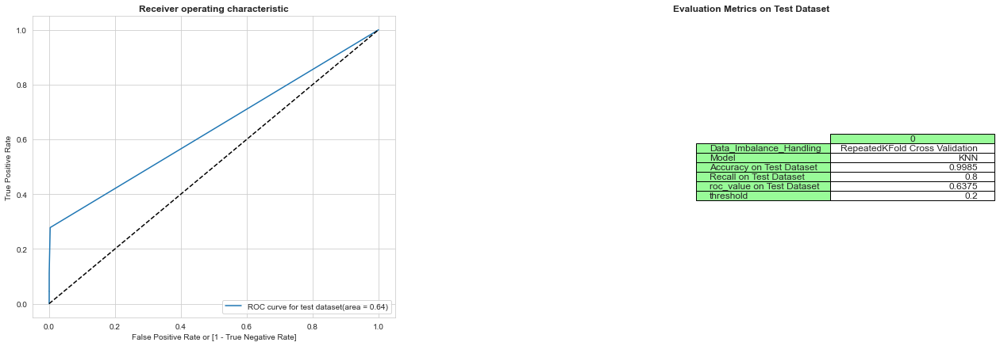

Time Taken by KNN Model: --- 1927.7650723457336 seconds ---


In [50]:
#Run KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

Decision Tree Models with  'gini' & 'entropy' criteria


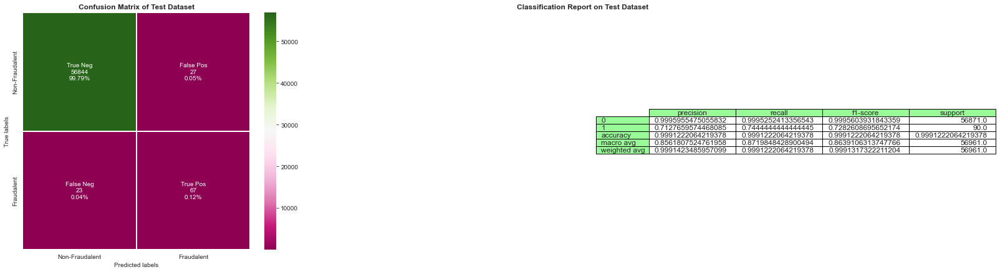

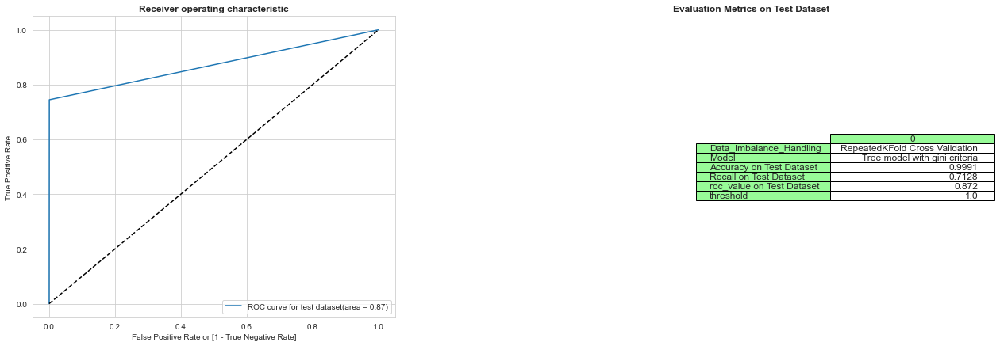

Time Taken by Tree Model with gini criteria: --- 36.934751749038696 seconds ---


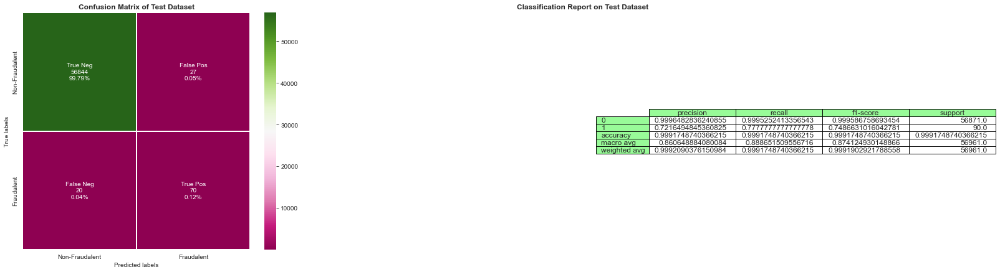

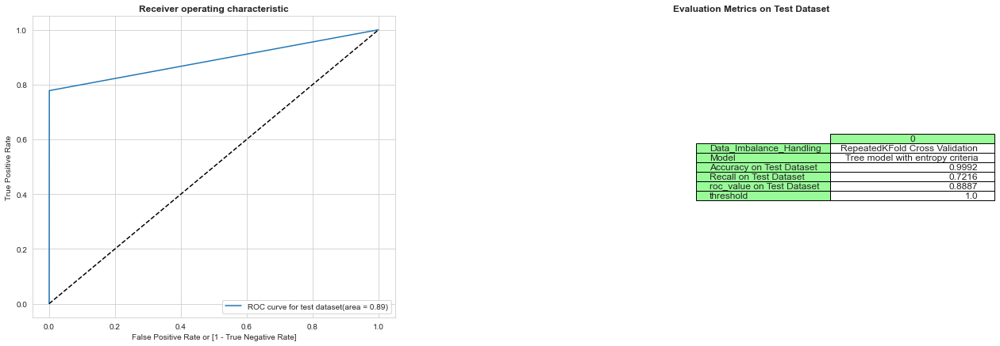

Time Taken by Tree Model with entropy criteria: --- 20.288379669189453 seconds ---


In [51]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

Random Forest Model


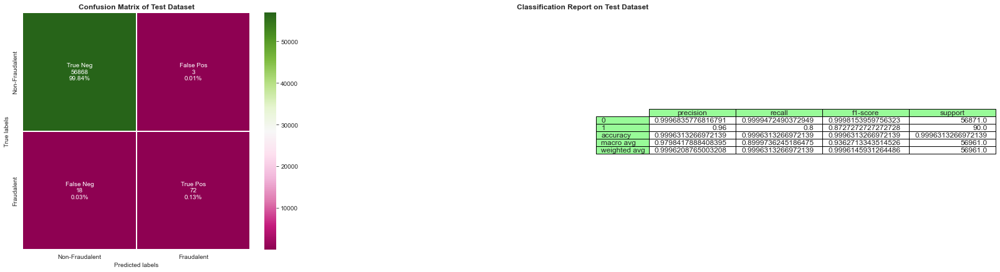

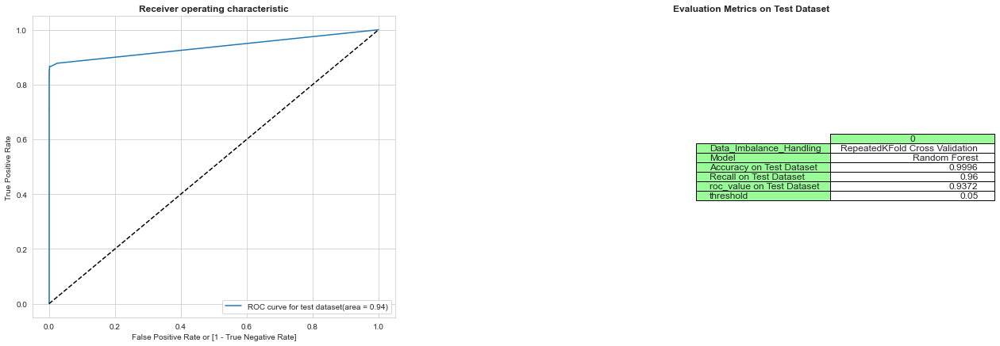

Time Taken by Random Forest Model: --- 358.9904158115387 seconds ---


In [52]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

XGBoost Model


C:\Users\User\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:06:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


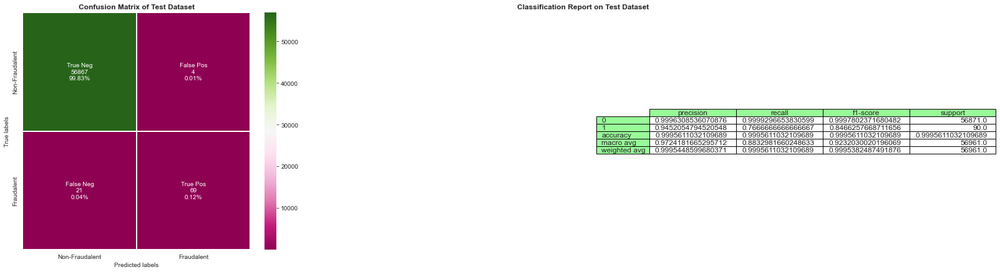

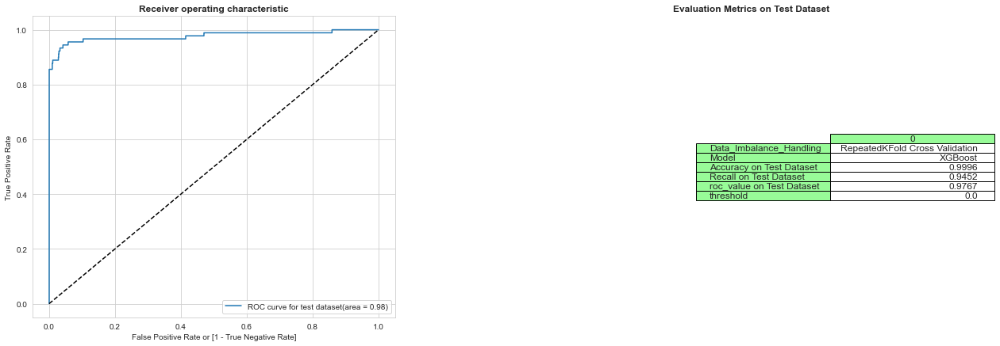

Time Taken by XGBoost Model: --- 117.92601752281189 seconds ---


In [53]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

SVM Model with Sigmoid Kernel


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


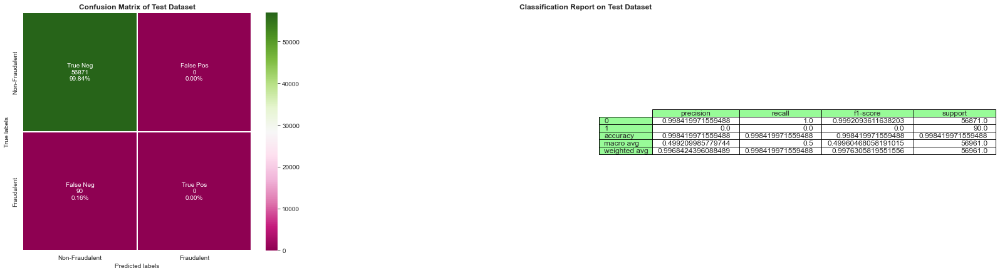

C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


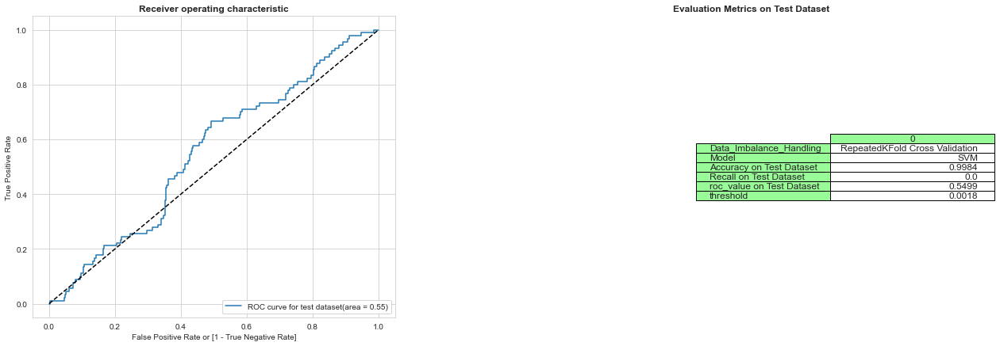

Time Taken by SVM Model: --- 230.25818848609924 seconds ---


In [54]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
df_Results = buildAndRunSVMModels(df_Results,"RepeatedKFold Cross Validation",X_train_cv,y_train_cv, X_test_cv, y_test_cv)

In [55]:
df_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7681,0.9662,0.0010
0,Logistic Regression with L1 Regularization,Power Transformer,0.9989,0.7385,0.9629,0.0091
0,KNN,Power Transformer,0.9993,0.8434,0.9008,0.2000
0,Tree model with gini criteria,Power Transformer,0.9990,0.6931,0.8643,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9990,0.6939,0.8539,1.0000
0,Random Forest,Power Transformer,0.9994,0.9067,0.9303,0.0200
0,XGBoost,Power Transformer,0.9995,0.9114,0.9759,0.0001
0,SVM,Power Transformer,0.9986,0.5743,0.8919,0.0014
0,Logistic Regression with L2 Regularization,RepeatedKFold Cross Validation,0.9992,0.9273,0.9782,0.0018
0,Logistic Regression with L1 Regularization,RepeatedKFold Cross Validation,0.9992,0.9123,0.9347,0.0253


It seems XGBoost with Repeated KFold cross validation has provided us 
the best results with ROC_Value of 0.9768 and recall of 0.9651

In [57]:
# Feature Importance

In [58]:
# Evaluate XGboost model

# fit model no training data
XGBmodel = XGBClassifier(random_state=42)
XGBmodel.fit(X_train_cv,y_train_cv)

coefficients = pd.concat([pd.DataFrame(X.columns),pd.DataFrame(np.transpose(XGBmodel.feature_importances_))], axis = 1)
coefficients.columns = ['Feature','feature_importances']

C:\Users\User\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:12:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


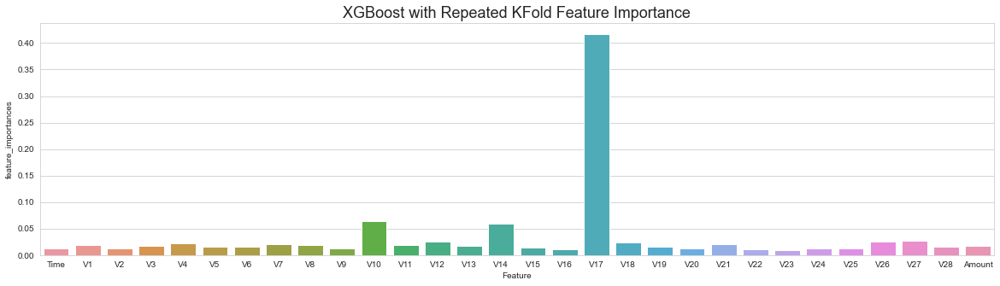

In [59]:
plt.figure(figsize=(20,5)) # to be deleted
sns.barplot(x='Feature', y='feature_importances', data=coefficients)
plt.title("XGBoost with Repeated KFold Feature Importance", fontsize=18)
plt.show()

In [60]:
# We can see that feature V17 has high impact followed by V14, V10.

# Model building on imbalanced dataset created by cross validation with StratifiedKFold

 We will feed the raw data(imbalanced) which is created by cross validation and StratifiedKFold to below models:
1. Logistic Regression with L2 Regularisation 
2. Logistic Regression with L1 Regularisation 
3. KNN 
4. Decision tree model with Gini criteria 
5. Decision tree model with Entropy criteria 
6. Random Forest 
7. XGBoost 
8. SVM Model

In [63]:
# Lets perfrom StratifiedKFold and check the results
skf = StratifiedKFold(n_splits=5, random_state=None)
# X is the feature set and y is the target
for train_index, test_index in skf.split(X,y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_SKF_cv, X_test_SKF_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_SKF_cv, y_test_SKF_cv = y.iloc[train_index], y.iloc[test_index]

TRAIN: [ 30473  30496  31002 ... 284804 284805 284806] TEST: [    0     1     2 ... 57017 57018 57019]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [ 30473  30496  31002 ... 113964 113965 113966]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [ 81609  82400  83053 ... 170946 170947 170948]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [150654 150660 150661 ... 227866 227867 227868]
TRAIN: [     0      1      2 ... 227866 227867 227868] TEST: [212516 212644 213092 ... 284804 284805 284806]


Logistic Regression with L1 And L2 Regularisation


C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line searc

Parameters for L2 regularisations: 
[[-3.80499251e-06  1.05376586e-02  5.96552307e-02 -7.60231582e-02
   2.15409083e-01  5.84977819e-02 -3.18705968e-02 -2.01376274e-02
  -1.16410120e-01 -7.02658551e-02 -1.61361257e-01  1.21571030e-01
  -1.87101461e-01 -3.82864893e-02 -3.59726718e-01 -2.64986524e-04
  -8.68323765e-02 -7.37015667e-02  9.69962881e-04  4.83574221e-03
  -2.85991910e-02  3.93552357e-02  2.59213900e-02 -1.11880939e-02
  -1.01734138e-02 -8.71074821e-03  6.07818266e-03 -1.05900543e-02
  -1.38352369e-03  3.93815999e-04]]
[-7.1132392]


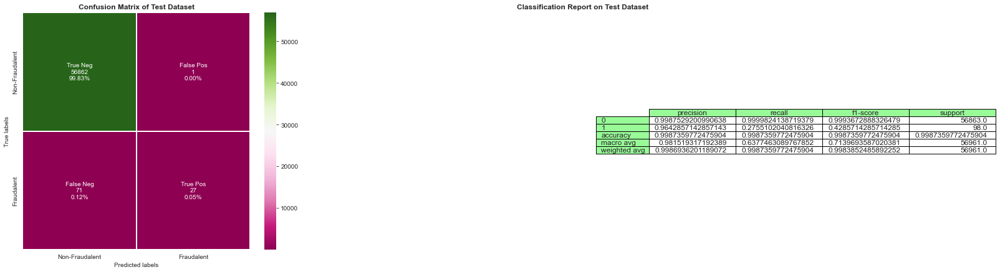

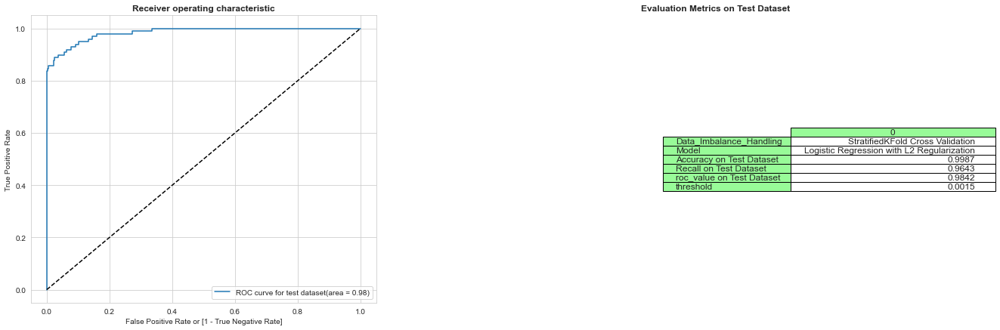

Time Taken by Logistic Regression/L2 RegModel: --- 772.3856236934662 seconds ---
Parameters for l1 regularisations: 
[[-2.09199430e-05  4.03848092e-02 -1.28679147e-01 -3.10211249e-01
   1.63488821e-02  4.27273294e-02 -3.41776874e-02  1.46180991e-01
  -8.55718115e-02 -7.36268289e-02 -1.22994277e-01 -9.05442356e-02
  -7.62353719e-03 -1.04499533e-01 -3.27074621e-01 -1.99183758e-01
  -1.13931040e-01 -2.00699017e-01  6.15000003e-02  8.29153106e-03
   1.24049902e-01  1.25362409e-01  1.73986437e-01  4.81296904e-02
  -1.57504604e-02 -4.27336930e-01 -2.91555134e-02 -2.54723432e-02
   2.84008397e-02 -1.64390033e-03]]
[-3.2109503]


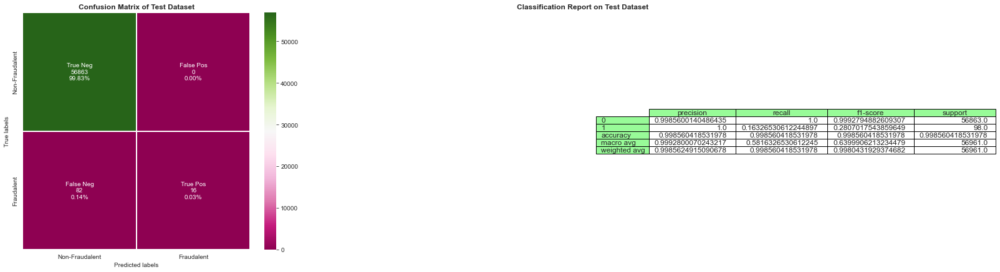

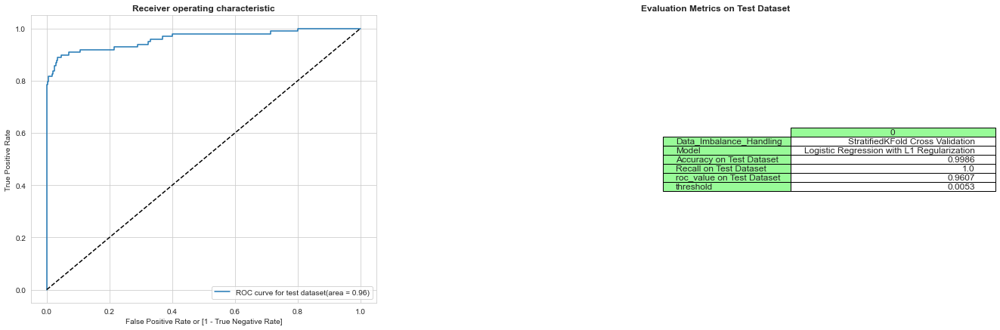

Time Taken by Logistic Regression/L1 RegModel: --- 881.66916847229 seconds ---


In [64]:
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results,"StratifiedKFold Cross Validation", X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

KNN Model


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


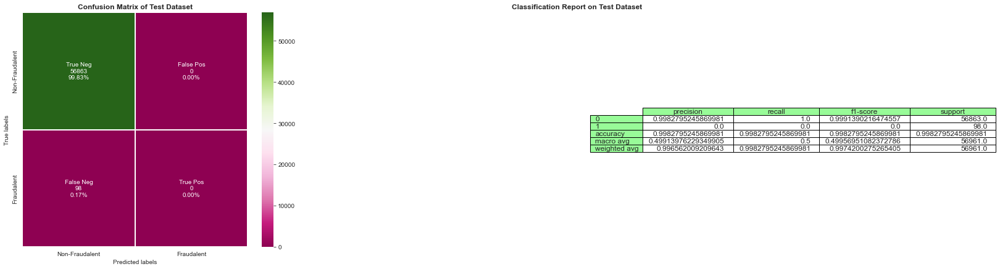

C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


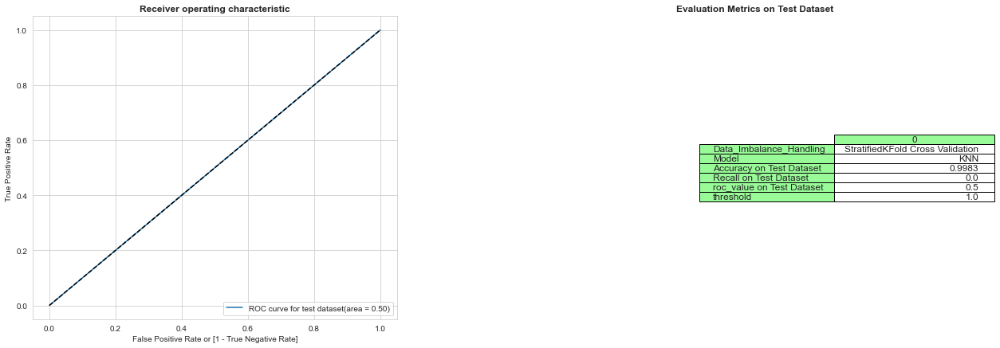

Time Taken by KNN Model: --- 1870.056874036789 seconds ---


In [65]:
#Run KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

Decision Tree Models with  'gini' & 'entropy' criteria


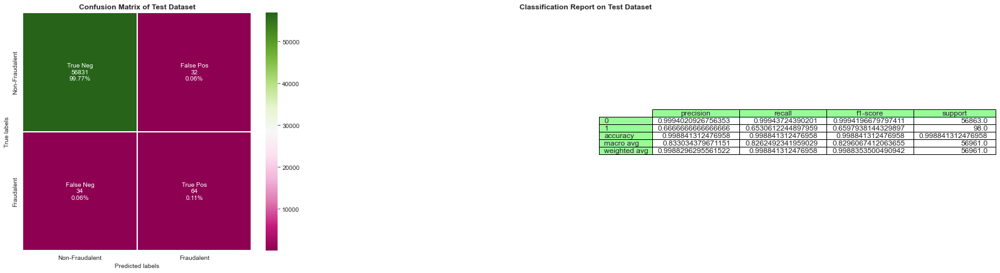

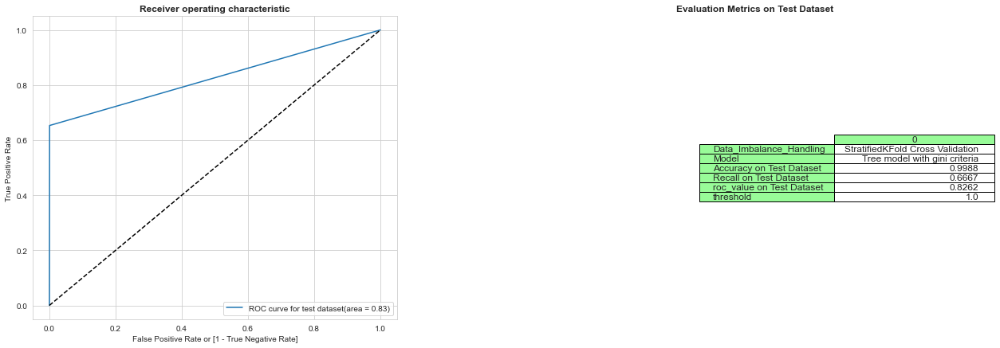

Time Taken by Tree Model with gini criteria: --- 37.52392101287842 seconds ---


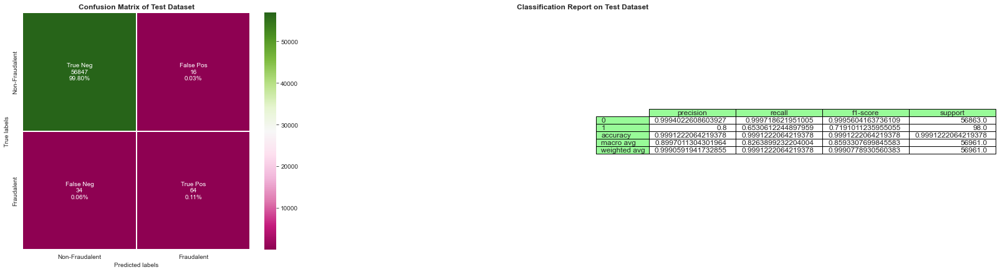

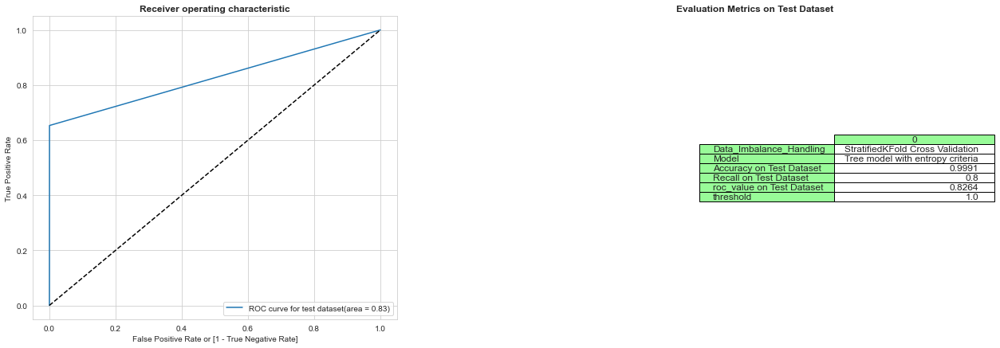

Time Taken by Tree Model with entropy criteria: --- 25.260490894317627 seconds ---


In [66]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

Random Forest Model


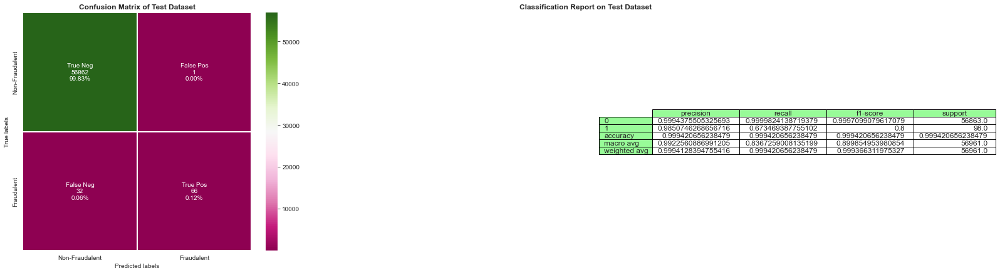

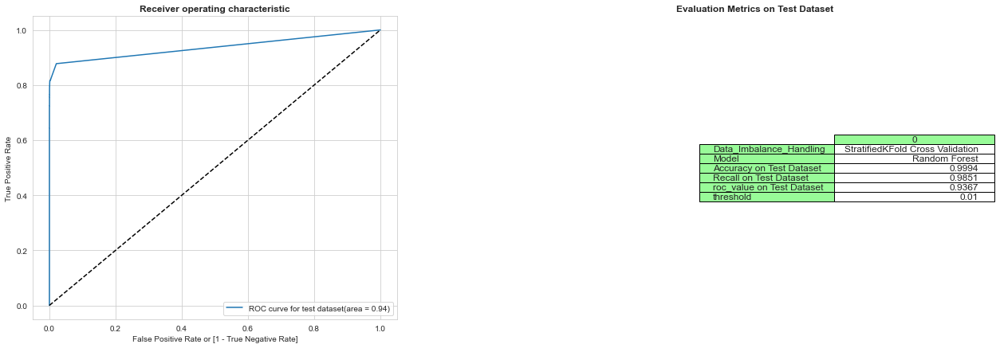

Time Taken by Random Forest Model: --- 364.4897391796112 seconds ---


In [67]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

XGBoost Model


C:\Users\User\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:09:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


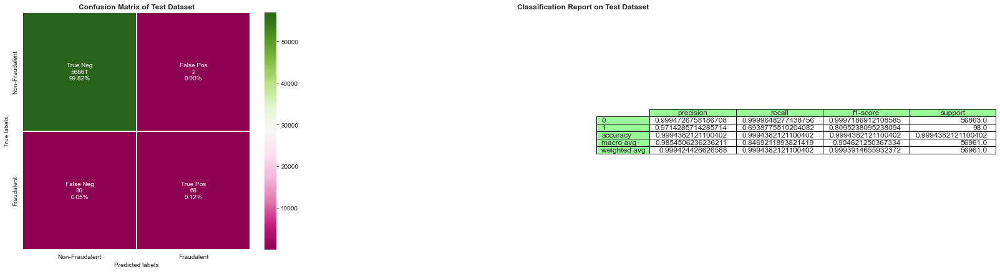

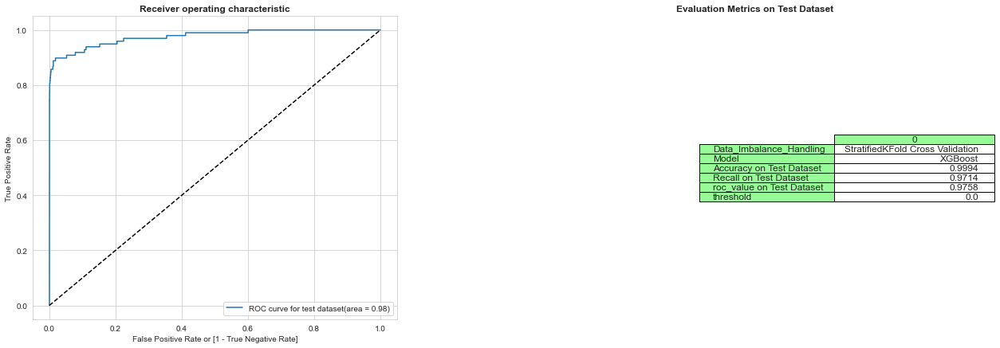

Time Taken by XGBoost Model: --- 105.31967949867249 seconds ---


In [68]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

SVM Model with Sigmoid Kernel


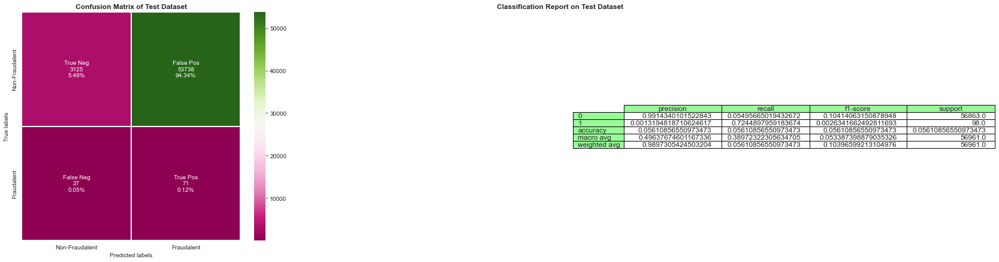

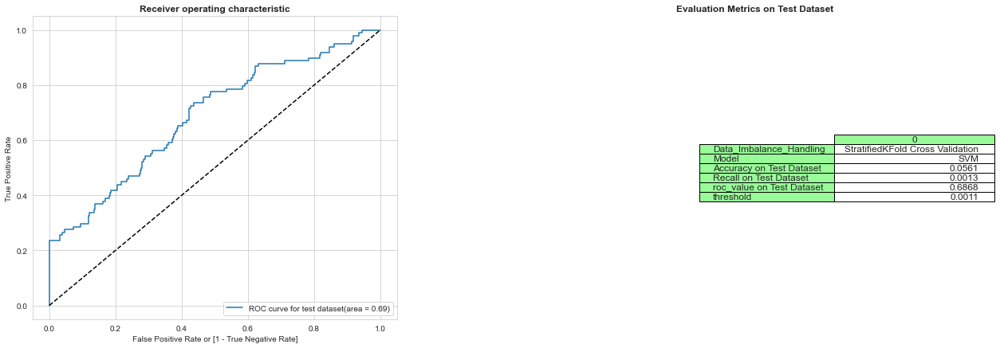

Time Taken by SVM Model: --- 201.52110052108765 seconds ---


In [69]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
df_Results = buildAndRunSVMModels(df_Results,"StratifiedKFold Cross Validation",X_train_SKF_cv,y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

In [70]:
df_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7681,0.9662,0.0010
0,Logistic Regression with L1 Regularization,Power Transformer,0.9989,0.7385,0.9629,0.0091
0,KNN,Power Transformer,0.9993,0.8434,0.9008,0.2000
0,Tree model with gini criteria,Power Transformer,0.9990,0.6931,0.8643,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9990,0.6939,0.8539,1.0000
0,Random Forest,Power Transformer,0.9994,0.9067,0.9303,0.0200
0,XGBoost,Power Transformer,0.9995,0.9114,0.9759,0.0001
0,SVM,Power Transformer,0.9986,0.5743,0.8919,0.0014
0,Logistic Regression with L2 Regularization,RepeatedKFold Cross Validation,0.9992,0.9273,0.9782,0.0018
0,Logistic Regression with L1 Regularization,RepeatedKFold Cross Validation,0.9992,0.9123,0.9347,0.0253


As the results show Logistic Regression with L2 Regularisation for StratifiedKFold cross validation provided best results on 
imbalanced datasets with roc_auc:0.9834 and recall:0.9667

In [72]:
# Feature Importance 

In [73]:
# Logistic Regression

num_C = list(np.power(10.0, np.arange(-10, 10)))
cv_num = KFold(n_splits=10, shuffle=True, random_state=42)

searchCV_l2 = LogisticRegressionCV(
          Cs= num_C
          ,penalty='l2'
          ,scoring='roc_auc'
          ,cv=cv_num
          ,random_state=42
          ,max_iter=10000
          ,fit_intercept=True
          ,solver='newton-cg'
          ,tol=10
      )

searchCV_l2.fit(X_train, y_train)
print ('Max auc_roc for l2:', searchCV_l2.scores_[1].mean(axis=0).max())

print("Parameters for l2 regularisations")
print(searchCV_l2.coef_)
print(searchCV_l2.intercept_) 
print(searchCV_l2.scores_) 

#find predicted vallues
y_pred_l2 = searchCV_l2.predict(X_test)

#Find predicted probabilities
y_pred_probs_l2 = searchCV_l2.predict_proba(X_test)[:,1] 

# Accuracy of L2/L1 models
Accuracy_l2 = accuracy_score(y_pred=y_pred_l2, y_true=y_test)

print("Accuracy of Logistic model with l2 regularisation : {0}".format(Accuracy_l2))

l2_roc_value = roc_auc_score(y_test, y_pred_probs_l2)
print("l2 roc_value: {0}" .format(l2_roc_value))
fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs_l2)
threshold = thresholds[np.argmax(tpr-fpr)]
print("l2 threshold: {0}".format(threshold))

C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line searc

Max auc_roc for l2: 0.9864681037153872
Parameters for l2 regularisations
[[-1.31943994e-06 -2.92678101e-02  3.76414358e-02 -7.54732060e-02
   7.99937424e-02 -4.34701725e-03 -2.34322094e-02 -4.81899675e-02
  -1.17298213e-02 -3.83490348e-02 -7.65968219e-02  6.17847870e-02
  -9.64608836e-02 -7.02830409e-03 -1.36876220e-01 -9.64163619e-04
  -5.62446645e-02 -8.12729244e-02 -2.08346250e-02  9.08101834e-03
   3.27622341e-03  1.86754621e-02  1.86114683e-04  9.61944362e-04
  -4.59836386e-03 -2.19690176e-04  1.79691671e-03  3.44958267e-03
   2.54198860e-03  2.03019393e-04]]
[-6.64300141]
{1: array([[0.59543765, 0.59597491, 0.59994334, 0.61456181, 0.71022169,
        0.93036446, 0.99531359, 0.99447351, 0.99450159, 0.99553094,
        0.99512921, 0.99512921, 0.99512921, 0.99512921, 0.99512921,
        0.99512921, 0.99512921, 0.99512921, 0.99512921, 0.99512921],
       [0.60202137, 0.60189597, 0.60140472, 0.61103972, 0.70203249,
        0.89108171, 0.98059555, 0.97614972, 0.98046498, 0.98205638,
  

In [74]:
searchCV_l2.coef_

array([[-1.31943994e-06, -2.92678101e-02,  3.76414358e-02,
        -7.54732060e-02,  7.99937424e-02, -4.34701725e-03,
        -2.34322094e-02, -4.81899675e-02, -1.17298213e-02,
        -3.83490348e-02, -7.65968219e-02,  6.17847870e-02,
        -9.64608836e-02, -7.02830409e-03, -1.36876220e-01,
        -9.64163619e-04, -5.62446645e-02, -8.12729244e-02,
        -2.08346250e-02,  9.08101834e-03,  3.27622341e-03,
         1.86754621e-02,  1.86114683e-04,  9.61944362e-04,
        -4.59836386e-03, -2.19690176e-04,  1.79691671e-03,
         3.44958267e-03,  2.54198860e-03,  2.03019393e-04]])

In [76]:
coefficients = pd.concat([pd.DataFrame(X.columns),pd.DataFrame(np.transpose(searchCV_l2.coef_))], axis = 1)
coefficients.columns = ['Feature','Importance Coefficient']

In [77]:
coefficients

,Feature,Importance Coefficient
0,Time,-0.000001
1,V1,-0.029268
2,V2,0.037641
3,V3,-0.075473
4,V4,0.079994
5,V5,-0.004347
6,V6,-0.023432
7,V7,-0.048190
8,V8,-0.011730
9,V9,-0.038349


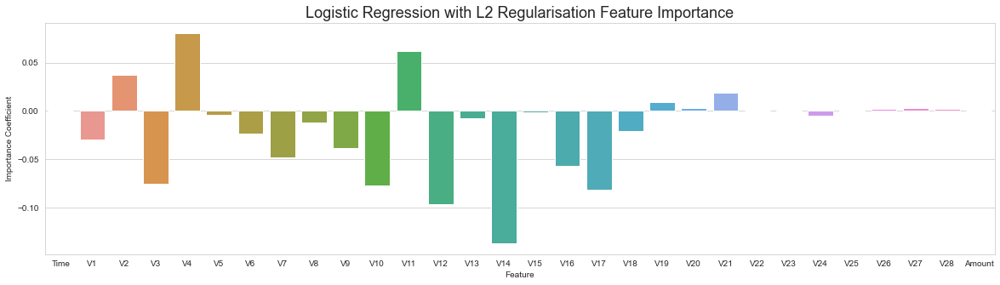

In [78]:
plt.figure(figsize=(20,5))
sns.barplot(x='Feature', y='Importance Coefficient', data=coefficients)
plt.title("Logistic Regression with L2 Regularisation Feature Importance", fontsize=18)
plt.show()

In [79]:
# It is evident that V4, V11, v5 has + ve imporatnce whereas V14, V12, V10 seems to have -ve impact on the predictaions

We will feed the balanced data which is created by Random Undersampling(RUS) to below models:
1. Logistic Regression with L2 Regularisation 
2. Logistic Regression with L1 Regularisation 
3. KNN 
4. Decision tree model with Gini criteria 
5. Decision tree model with Entropy criteria 
6. Random Forest 
7. XGBoost 
8. SVM Model

In [81]:
# Undersampling
RUS = RandomUnderSampler(sampling_strategy=0.5)
# fit and apply the transform
X_Under, y_Under = RUS.fit_resample(X_train, y_train)
#Create Dataframe
X_Under = pd.DataFrame(data=X_Under,   columns=cols)

Logistic Regression with L1 And L2 Regularisation


C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line searc

Parameters for L2 regularisations: 
[[-1.17663491e-05  8.93183916e-02 -2.04820730e-01 -3.29273985e-01
   7.10249733e-01  1.13385194e-02 -1.26026453e-01  8.83266745e-02
  -3.72637830e-01 -1.11101422e-01 -3.64432866e-01  2.15343130e-01
  -4.45532294e-01 -2.31015426e-01 -6.15901138e-01 -1.09840916e-01
  -2.06203389e-01 -1.14615880e-01  5.91657737e-02  4.08464910e-03
  -3.68298635e-01 -3.13568338e-03  2.75216980e-01  1.61464458e-01
   5.11564178e-02 -9.50673267e-02 -1.32034817e-01  2.41845838e-01
   6.20308974e-02  1.14834756e-04]]
[-2.44867805]


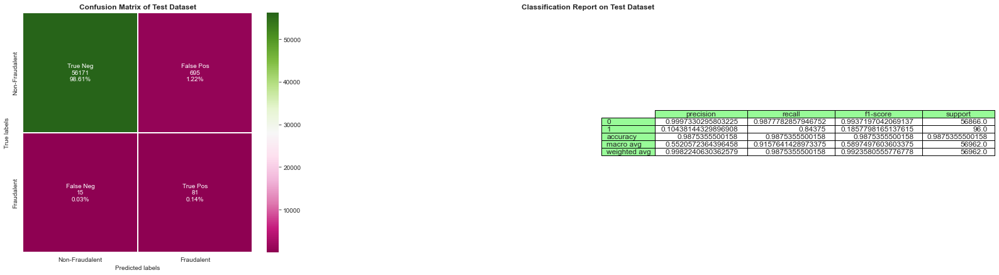

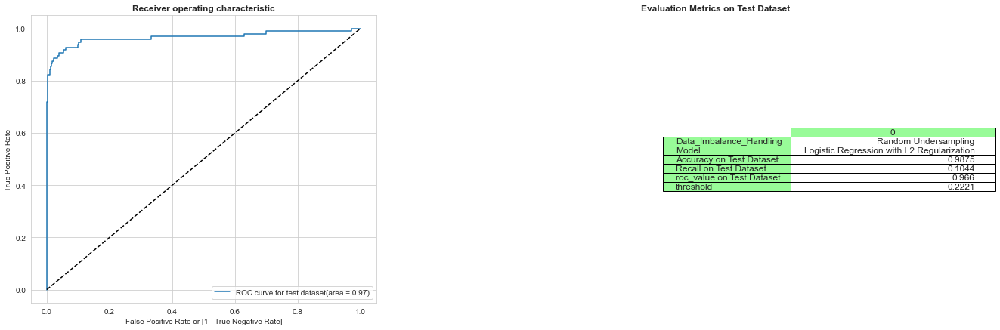

Time Taken by Logistic Regression/L2 RegModel: --- 9.671129703521729 seconds ---
Parameters for l1 regularisations: 
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


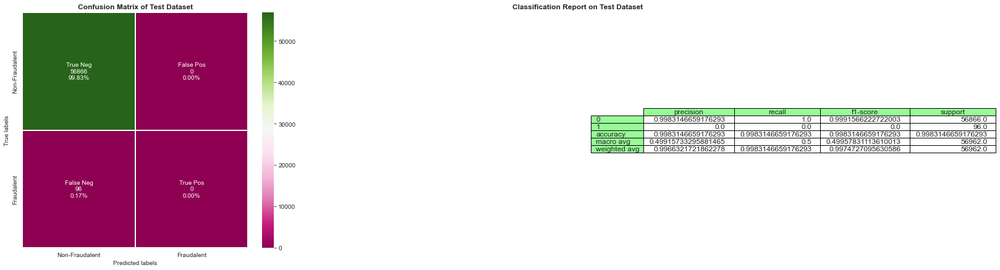

C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


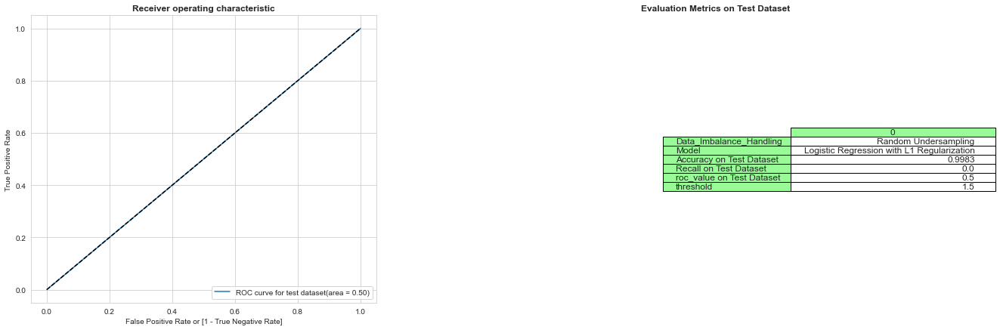

Time Taken by Logistic Regression/L1 RegModel: --- 12.36891222000122 seconds ---


In [82]:
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results,"Random Undersampling", X_Under, y_Under , X_test, y_test)

KNN Model


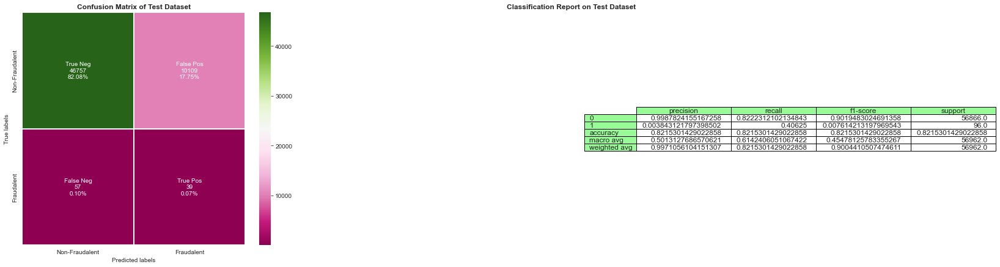

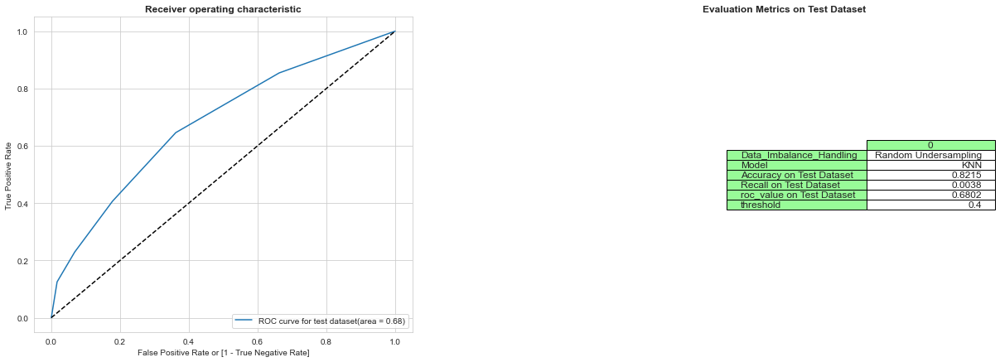

Time Taken by KNN Model: --- 9.814394235610962 seconds ---


In [83]:
# Run KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results,"Random Undersampling",X_Under, y_Under , X_test, y_test)

Decision Tree Models with  'gini' & 'entropy' criteria


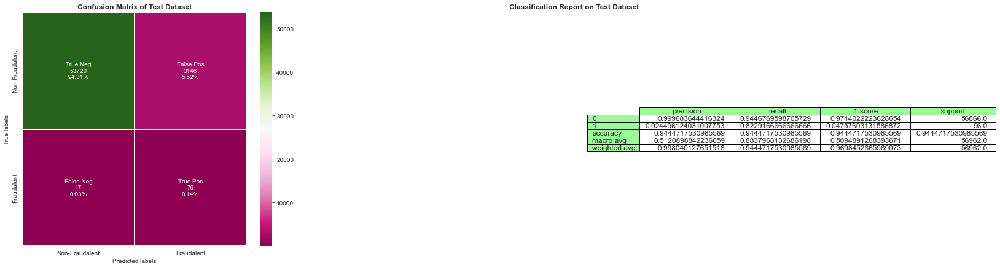

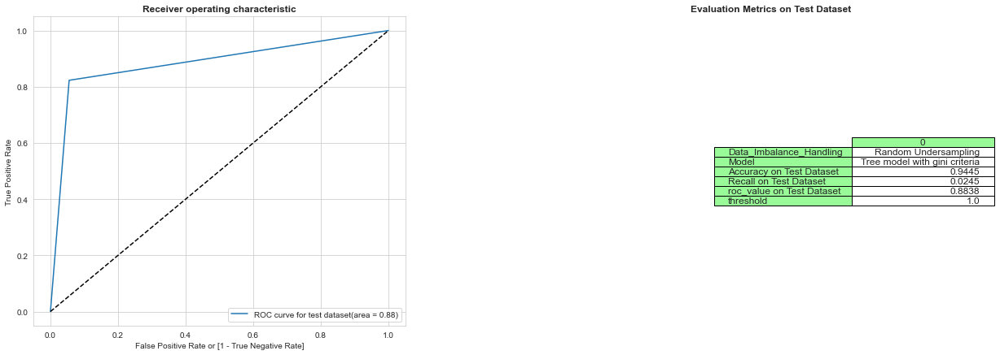

Time Taken by Tree Model with gini criteria: --- 1.6436052322387695 seconds ---


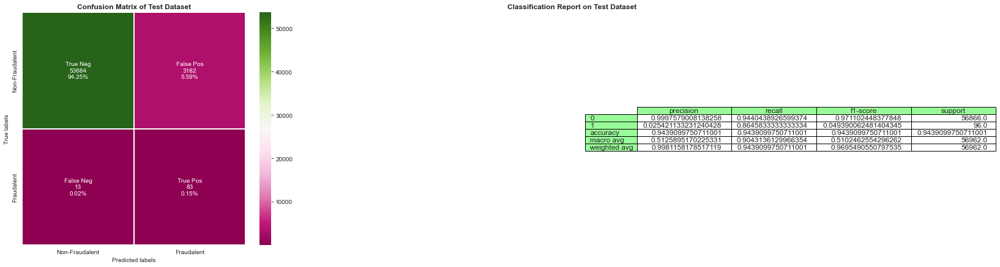

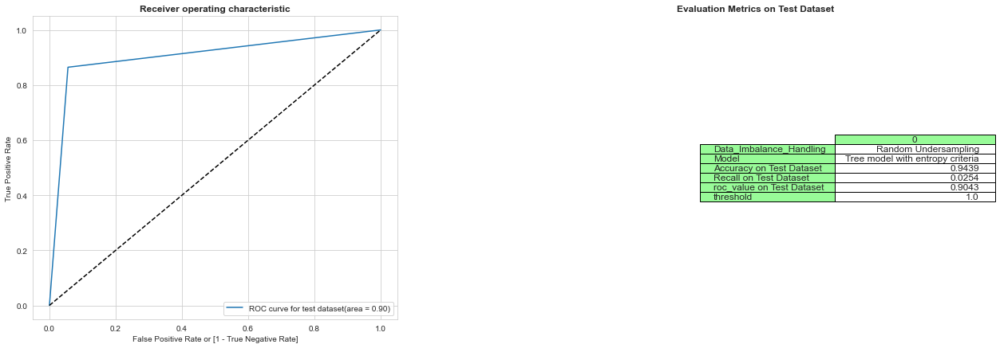

Time Taken by Tree Model with entropy criteria: --- 1.700451135635376 seconds ---


In [84]:
# Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)

Random Forest Model


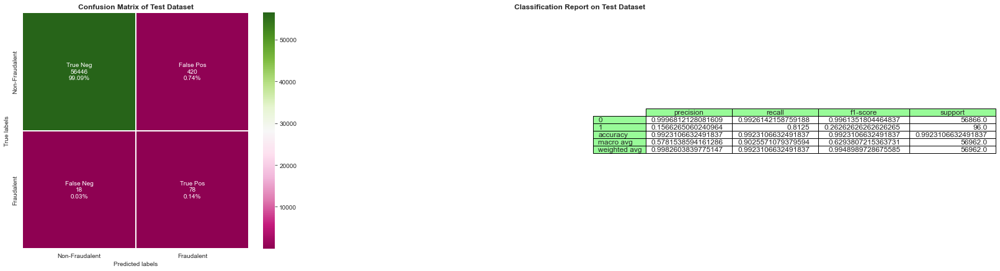

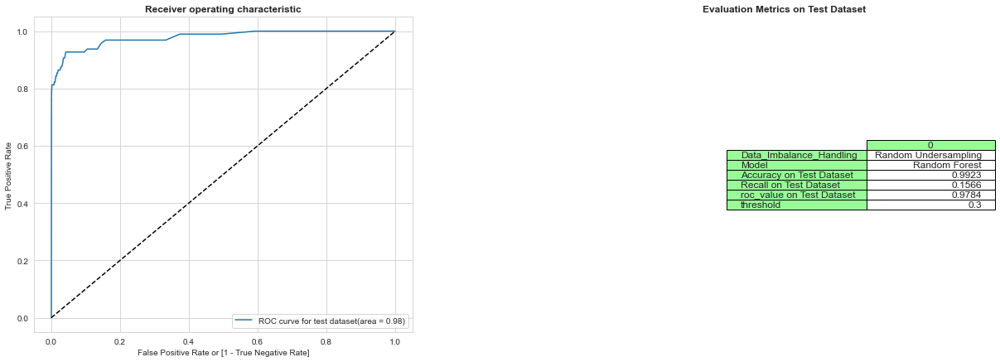

Time Taken by Random Forest Model: --- 5.267908334732056 seconds ---


In [85]:
# Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)

XGBoost Model
[18:37:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\User\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


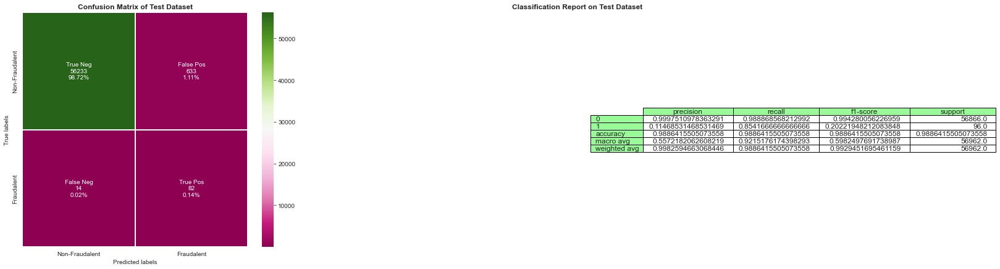

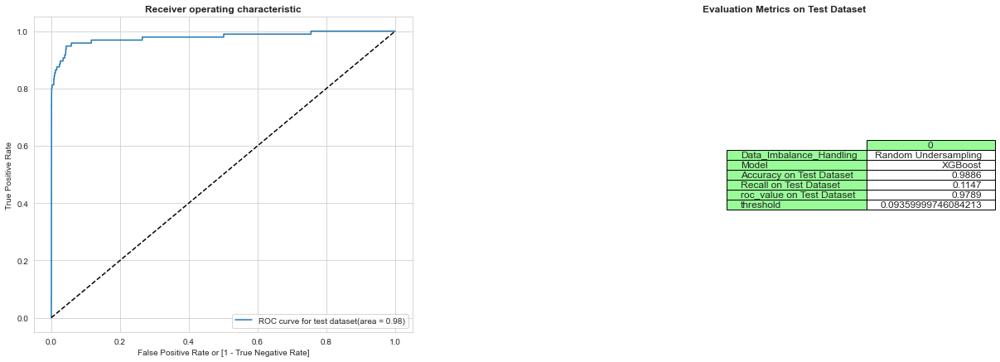

Time Taken by XGBoost Model: --- 2.592067241668701 seconds ---


In [86]:
# Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)

SVM Model with Sigmoid Kernel


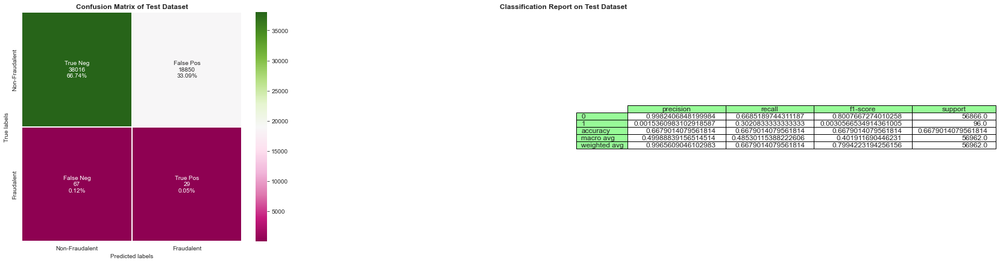

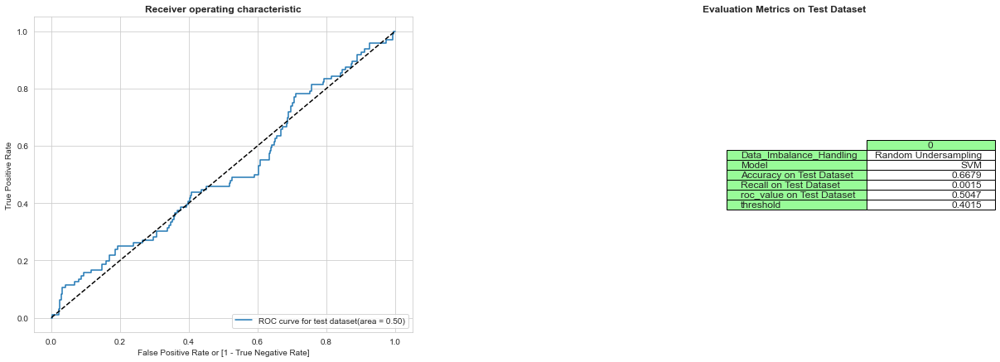

Time Taken by SVM Model: --- 8.197088241577148 seconds ---


In [87]:
#Run SVM Model with Sigmoid Kernel
print("SVM Model with Sigmoid Kernel")
df_Results = buildAndRunSVMModels(df_Results, "Random Undersampling",X_Under, y_Under , X_test, y_test)

In [88]:
snipdf_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7681,0.9662,0.0010
0,Logistic Regression with L1 Regularization,Power Transformer,0.9989,0.7385,0.9629,0.0091
0,KNN,Power Transformer,0.9993,0.8434,0.9008,0.2000
0,Tree model with gini criteria,Power Transformer,0.9990,0.6931,0.8643,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9990,0.6939,0.8539,1.0000
0,Random Forest,Power Transformer,0.9994,0.9067,0.9303,0.0200
0,XGBoost,Power Transformer,0.9995,0.9114,0.9759,0.0001
0,SVM,Power Transformer,0.9986,0.5743,0.8919,0.0014
0,Logistic Regression with L2 Regularization,RepeatedKFold Cross Validation,0.9992,0.9273,0.9782,0.0018
0,Logistic Regression with L1 Regularization,RepeatedKFold Cross Validation,0.9992,0.9123,0.9347,0.0253


It seems Undersampling has impacted the recall value of these models. 
There is an increase in the false positives. Lets try handling the class imbalance using other techniques

# Perform class balancing with : Random Oversampling - SMOTE - ADASYN

We will use Random Oversampling method to handle the class imbalance
1. First we will display class distibution with and without the Random Oversampling. 
2. Then We will use the oversampled with StratifiedKFold cross validation method to genearte Train And test datasets.

Once we have train and test dataset we will feed the data to below models:

    1. Logistic Regression with L2 Regularisation 
    2. Logistic Regression with L1 Regularisation 
    3. KNN 
    4. Decision tree model with Gini criteria
    5. Decision tree model with Entropy criteria 
    6. Random Forest 
    7. XGBoost 
    8. SVM Model I tried SVM (support vector Machine) model, but due to extensive processive power requirement and time take, I have commented it out.
 Once we get results for above model, we will compare the results and select model which provided best results for the Random oversampling techinique



In [97]:
skf = StratifiedKFold(n_splits=5,shuffle= False, random_state=None)

for fold, (train_index, test_index) in enumerate(skf.split(X,y), 1):
    X_train = X.loc[train_index]
    y_train = y.loc[train_index] 
    X_test = X.loc[test_index]
    y_test = y.loc[test_index]  
    ROS = RandomOverSampler(sampling_strategy=0.5)
    X_over, y_over= ROS.fit_resample(X_train, y_train)

X_over = pd.DataFrame(data=X_over,   columns=cols) # Create Dataframe for X_over

Logistic Regression with L1 And L2 Regularisation


C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line searc

Parameters for L2 regularisations: 
[[-1.19674643e-05  4.16964749e-01  3.51338007e-01  1.47952955e-01
   8.20814502e-01  3.95303707e-01 -4.53907778e-01 -3.32405090e-01
  -3.44500865e-01 -3.20926511e-01 -6.82746718e-01  1.66082645e-01
  -7.94844363e-01 -3.69472036e-01 -9.24245996e-01 -2.22982202e-02
  -5.18116877e-01 -3.19686677e-01 -9.62196095e-02  1.56196143e-01
  -7.34107070e-01  1.02489875e-01  6.56577858e-01  1.10880249e-01
  -3.43977103e-01  7.28583331e-02 -4.42866425e-02 -3.77367310e-01
   1.93546600e-01  5.38673060e-03]]
[-3.66280279]


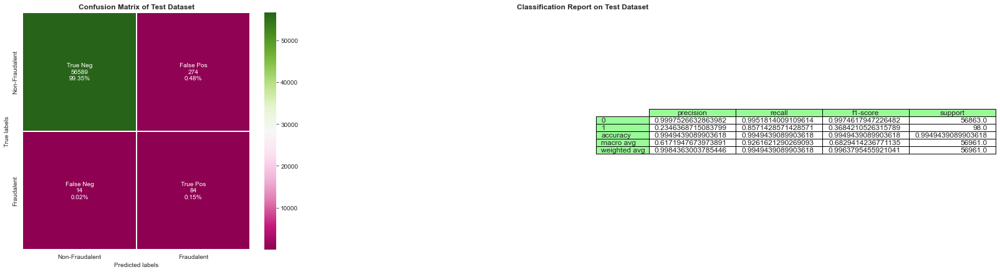

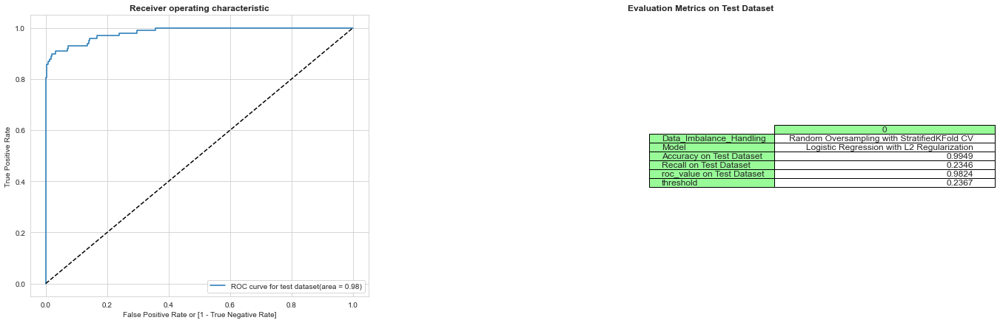

Time Taken by Logistic Regression/L2 RegModel: --- 2945.02082157135 seconds ---
Parameters for l1 regularisations: 
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


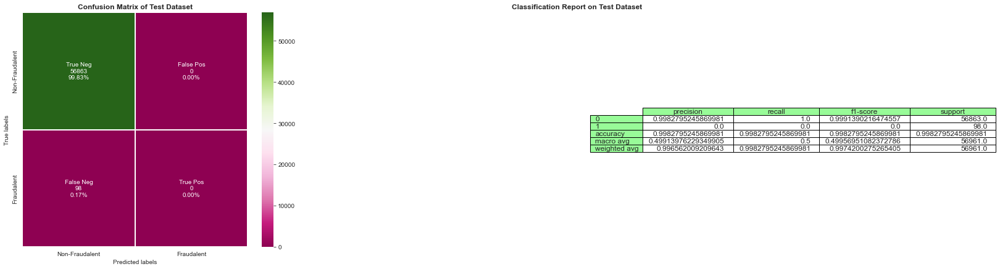

C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


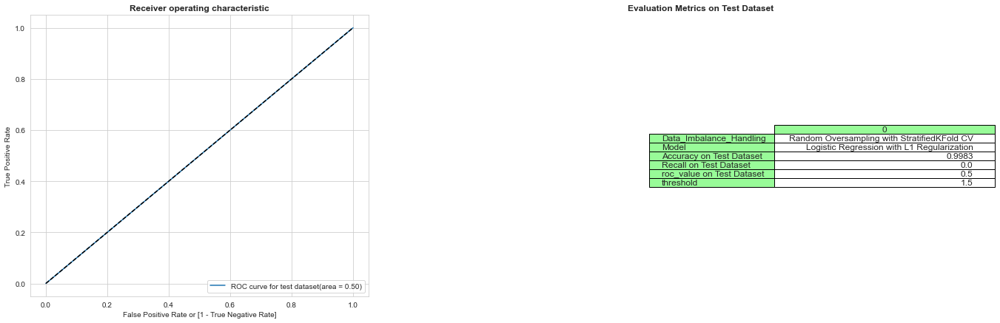

Time Taken by Logistic Regression/L1 RegModel: --- 3037.2826583385468 seconds ---


In [99]:
Data_Imbalance_Handling = "Random Oversampling with StratifiedKFold CV"
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results , Data_Imbalance_Handling , X_over, y_over, X_test, y_test)

KNN Model


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


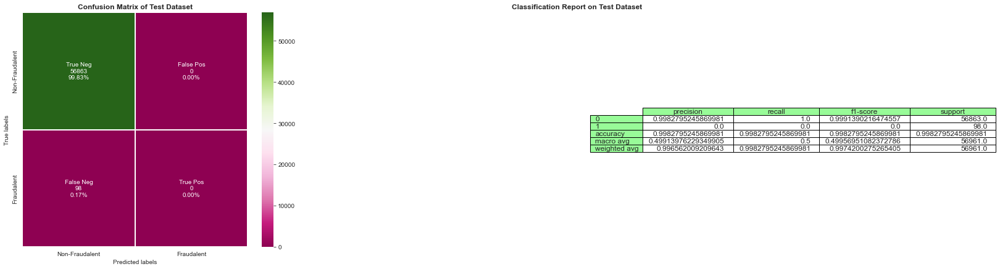

C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


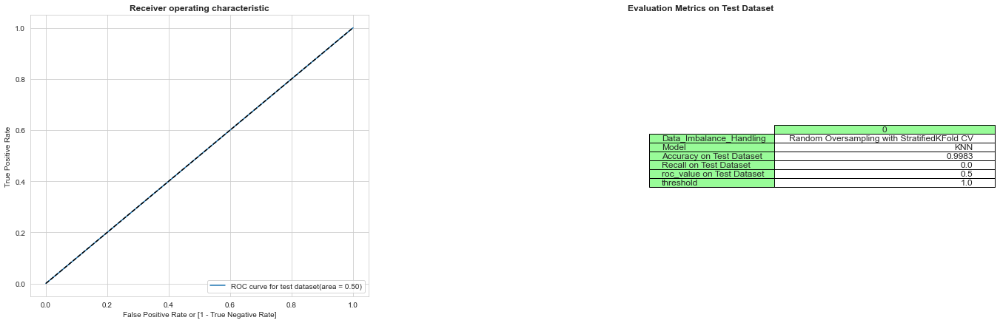

Time Taken by KNN Model: --- 1774.3861556053162 seconds ---


In [100]:
#Run KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results , Data_Imbalance_Handling,X_over, y_over, X_test, y_test)

Decision Tree Models with 'gini' & 'entropy' criteria


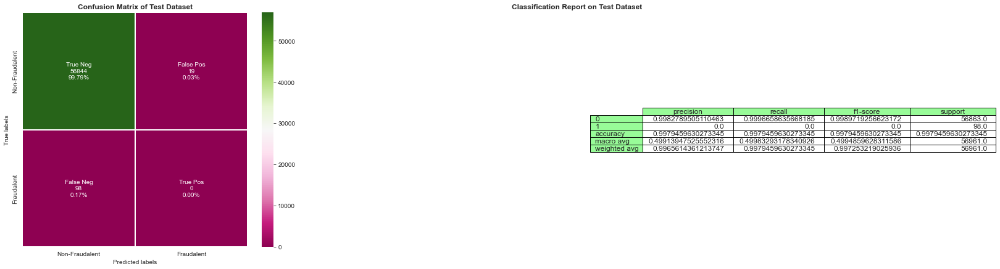

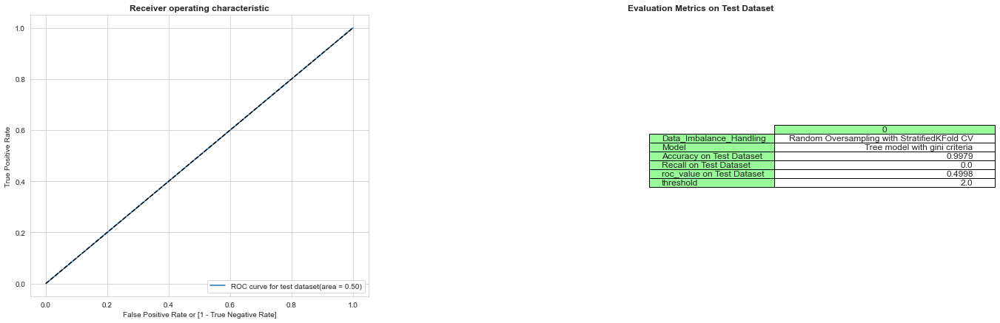

Time Taken by Tree Model with gini criteria: --- 19.50861692428589 seconds ---


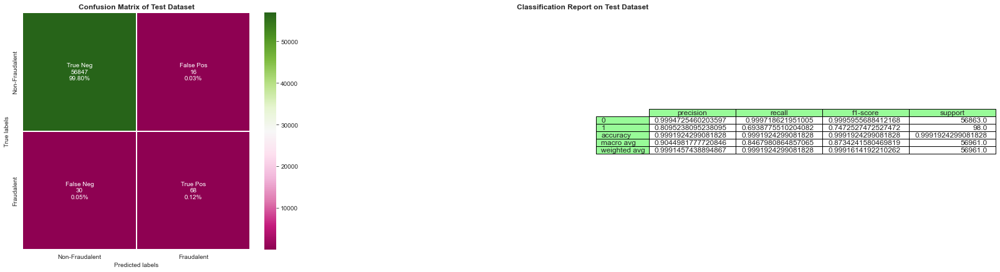

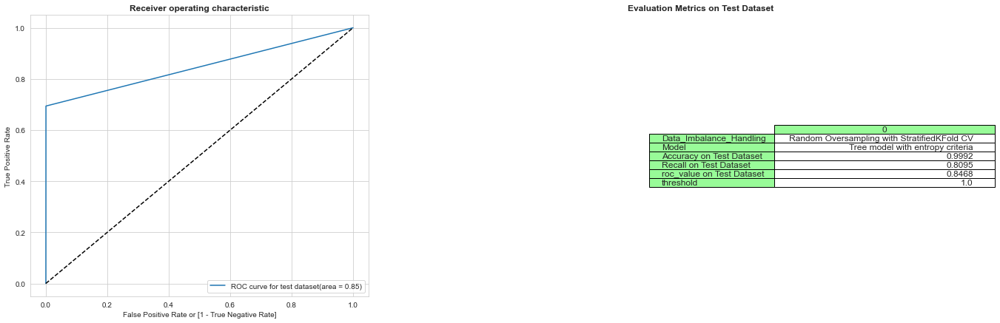

Time Taken by Tree Model with entropy criteria: --- 19.993378400802612 seconds ---


In [101]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with 'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results , Data_Imbalance_Handling,X_over, y_over, X_test, y_test)

Random Forest Model


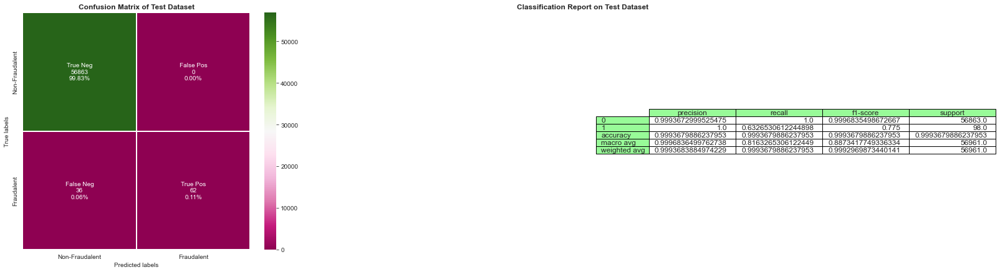

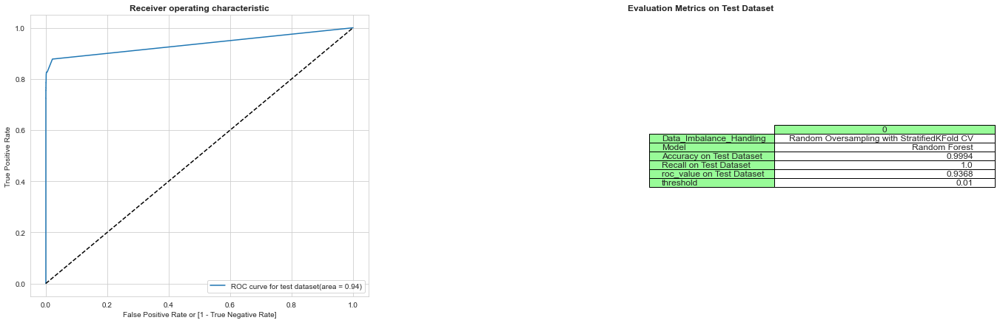

Time Taken by Random Forest Model: --- 262.7112855911255 seconds ---


In [102]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results , Data_Imbalance_Handling,X_over, y_over, X_test, y_test)

XGBoost Model


C:\Users\User\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:21:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


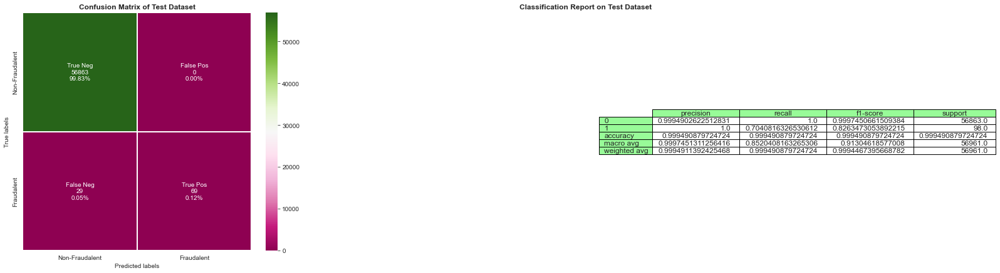

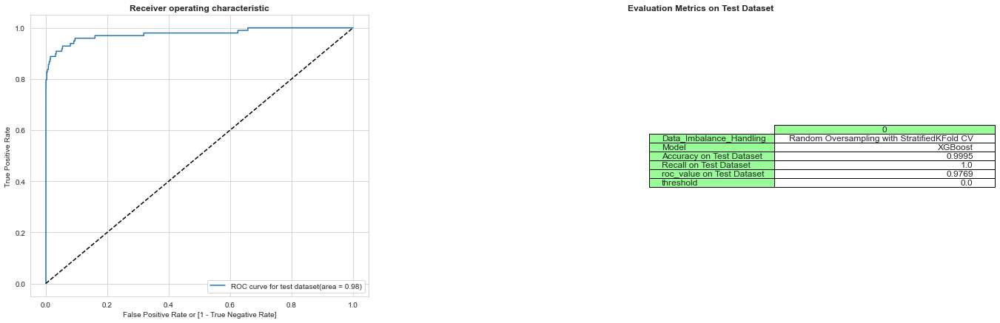

Time Taken by XGBoost Model: --- 176.7257058620453 seconds ---


In [103]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results , Data_Imbalance_Handling,X_over, y_over, X_test, y_test)

In [ ]:
# # Run SVM Model with Sigmoid Kernel
# print("SVM Model with Sigmoid Kernel")
# start_time = time.time()
# df_Results = buildAndRunSVMModels(df_Results , Data_Imbalance_Handiling,X_over, y_over, X_test, y_test)
# print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))

In [104]:
df_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7681,0.9662,0.0010
0,Logistic Regression with L1 Regularization,Power Transformer,0.9989,0.7385,0.9629,0.0091
0,KNN,Power Transformer,0.9993,0.8434,0.9008,0.2000
0,Tree model with gini criteria,Power Transformer,0.9990,0.6931,0.8643,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9990,0.6939,0.8539,1.0000
0,Random Forest,Power Transformer,0.9994,0.9067,0.9303,0.0200
0,XGBoost,Power Transformer,0.9995,0.9114,0.9759,0.0001
0,SVM,Power Transformer,0.9986,0.5743,0.8919,0.0014
0,Logistic Regression with L2 Regularization,RepeatedKFold Cross Validation,0.9992,0.9273,0.9782,0.0018
0,Logistic Regression with L1 Regularization,RepeatedKFold Cross Validation,0.9992,0.9123,0.9347,0.0253


In [105]:
# Random Oversampling seems to have +ve change in prediction for XGBoost when compared to Undersampling. 
# Its Recall has improved to 0.96 and the ROC value is holding good at 0.97

Model building - imbalanced handled by SMOTE Oversamplng

We will use SMOTE Oversampling method to handle the class imbalance
1. First we will display class distibution with and without the SMOTE Oversampling. 
2. Then We will use the oversampled with StratifiedKFold cross validation method to genearte Train And test datasets.

Once we have train and test dataset we will feed the data to below models:
1. Logistic Regression with L2 Regularisation 
2. Logistic Regression with L1 Regularisation 
3. KNN 
4. Decision tree model with Gini criteria 
5. Decision tree model with Entropy criteria 
6. Random Forest 
7. XGBoost 
8. SVM Model We did try SVM (support vector Machine) model , but due to extensive processive power requirement we avoided useing the model.

Once we get results for above model, we will compare the results and select model which provided best results for the Random oversampling techinique

# Print the class distribution after applying SMOTE

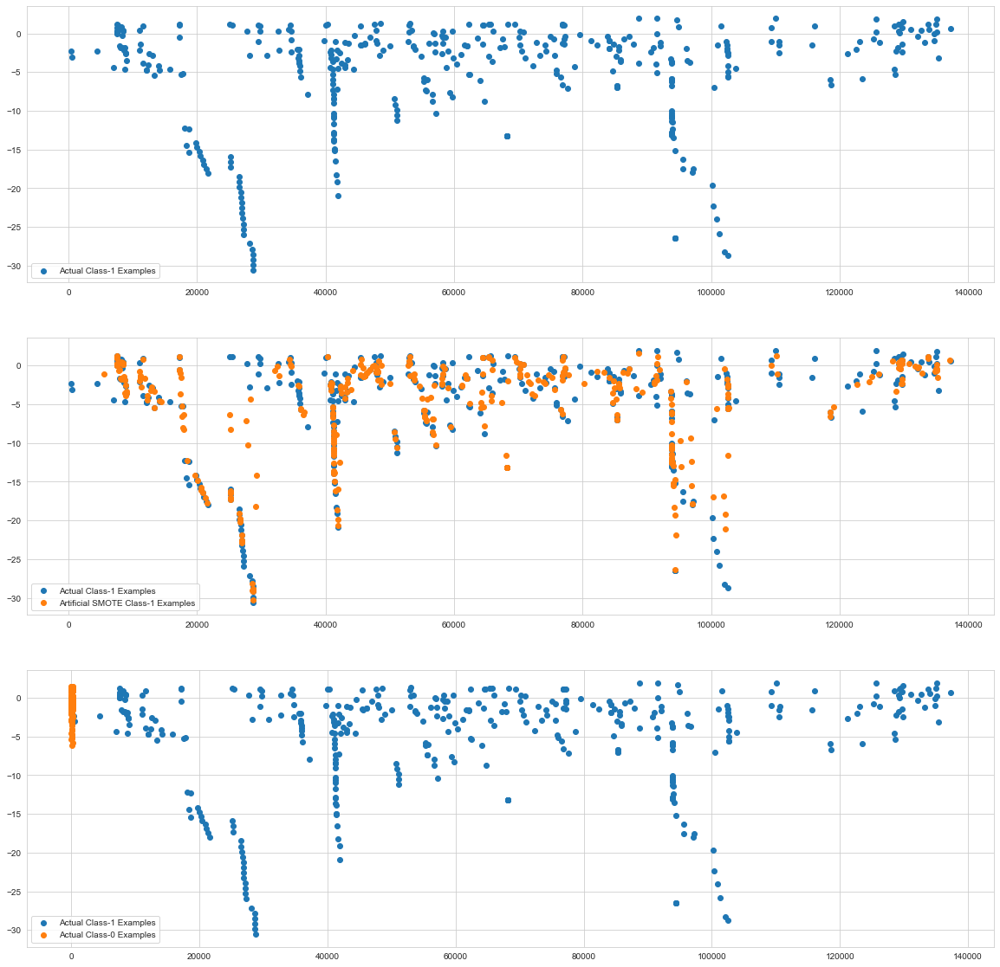

In [106]:
SMOTE_over = SMOTE(random_state=0)

X_train_Smote, y_train_Smote= SMOTE_over.fit_resample(X_train, y_train) 

#Create dataframe
#X_train_Smote = pd.DataFrame(data=X_train_Smote,   columns=cols)
# Artificial minority samples and corresponding minority labels from SMOTE are appended
# below X_train and y_train respectively
# So to exclusively get the artificial minority samples from SMOTE, we do
X_train_smote_1 = X_train_Smote[X_train.shape[0]:]

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]


plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()

plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
n = X_train_1.shape[0]
plt.scatter(X_train_smote_1.iloc[:n, 0], X_train_smote_1.iloc[:n, 1], label='Artificial SMOTE Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:n, 0], X_train_0[:n, 1], label='Actual Class-0 Examples')
plt.legend()

#Create dataframe
X_train_Smote = pd.DataFrame(data=X_train_Smote,   columns=cols)

In [107]:
skf = StratifiedKFold(n_splits=5, random_state=None)

for fold, (train_index, test_index) in enumerate(skf.split(X,y), 1):
    X_train = X.loc[train_index]
    y_train = y.loc[train_index] 
    X_test = X.loc[test_index]
    y_test = y.loc[test_index]  
    SMOTE_skf = SMOTE(random_state=0)
    X_train_Smote, y_train_Smote= SMOTE_skf.fit_resample(X_train, y_train)

X_train_Smote = pd.DataFrame(data=X_train_Smote, columns=cols) # Create Dataframe for X_over

Logistic Regression with L1 And L2 Regularisation


C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line searc

Parameters for L2 regularisations: 
[[-1.60067625e-05  1.67970213e+00  1.42804549e+00  9.49191097e-01
   8.81843619e-01  1.44248659e+00 -1.02565533e+00 -1.74712478e+00
  -3.29350172e-01 -1.02229571e+00 -1.89306873e+00  5.94777246e-01
  -1.70196198e+00 -4.71044081e-01 -1.98794408e+00 -2.21064454e-01
  -1.09329459e+00 -1.75977265e+00 -6.51870374e-01  7.87619445e-01
  -2.36498111e+00  6.30743468e-02  1.09002140e+00  1.43686786e+00
  -4.25976345e-01  1.11063053e-01  1.51208133e-01 -1.50194215e+00
   9.94159898e-01  1.92884330e-02]]
[-5.85063168]


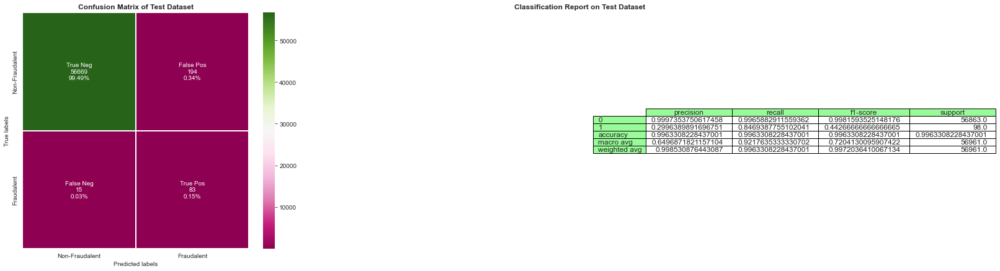

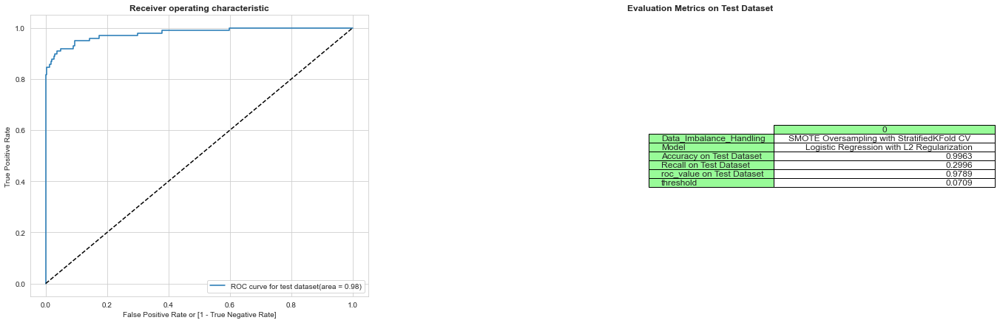

Time Taken by Logistic Regression/L2 RegModel: --- 3585.136855363846 seconds ---
Parameters for l1 regularisations: 
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


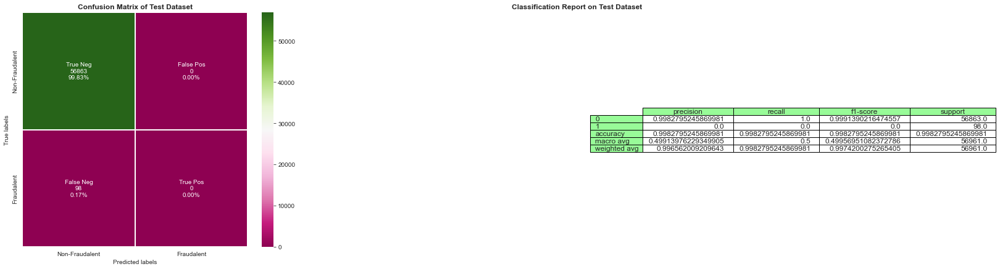

C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


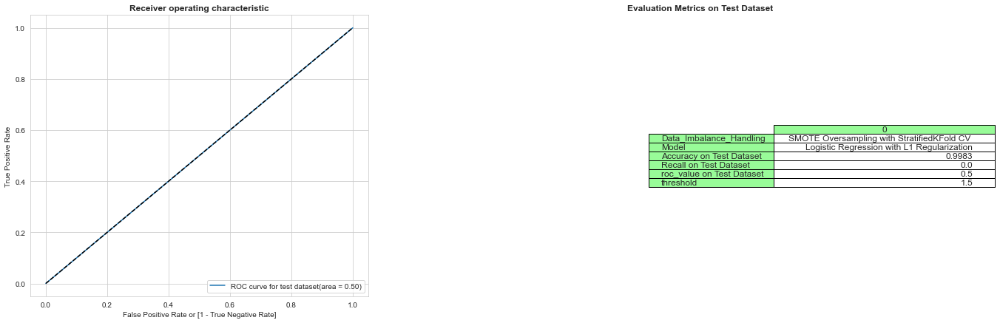

Time Taken by Logistic Regression/L1 RegModel: --- 3695.8384733200073 seconds ---


In [108]:
Data_Imbalance_Handling = "SMOTE Oversampling with StratifiedKFold CV "
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results, Data_Imbalance_Handling, X_train_Smote, y_train_Smote , X_test, y_test)

KNN Model


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


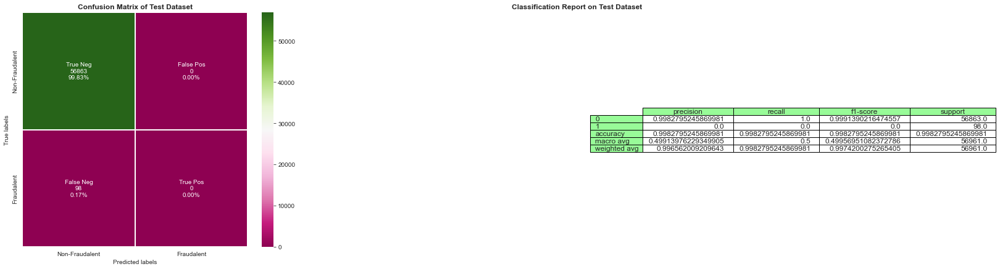

C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


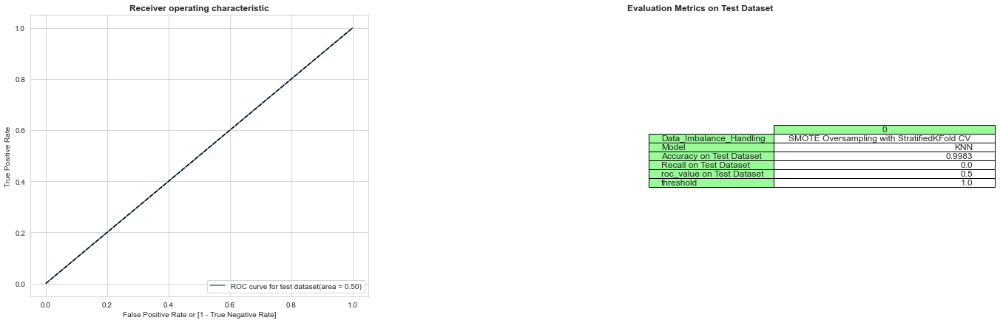

Time Taken by KNN Model: --- 2019.8043973445892 seconds ---


In [110]:
#Run KNN Model - takes long time; uncomment to train this model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results, Data_Imbalance_Handling, X_train_Smote, y_train_Smote , X_test, y_test)

Decision Tree Models with  'gini' & 'entropy' criteria


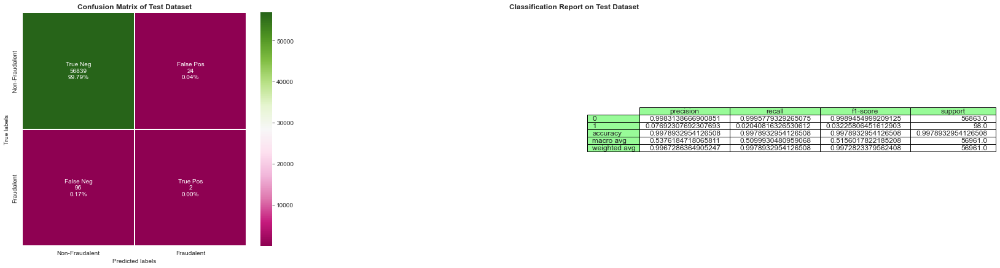

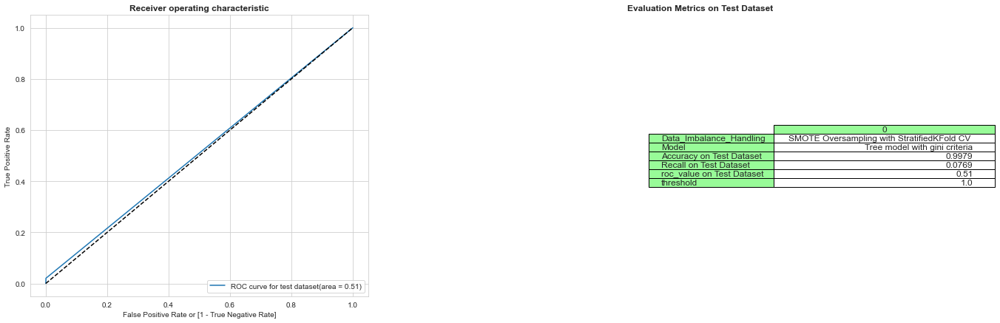

Time Taken by Tree Model with gini criteria: --- 66.42953419685364 seconds ---


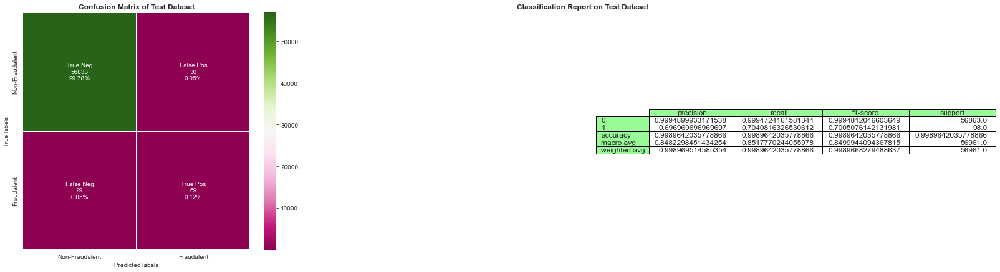

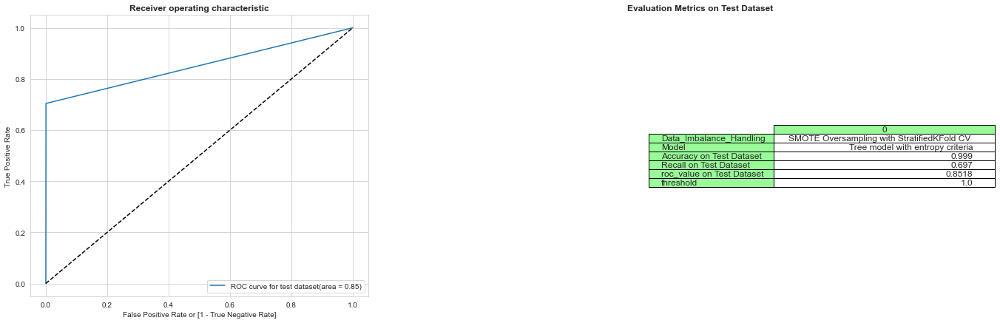

Time Taken by Tree Model with entropy criteria: --- 45.26736092567444 seconds ---


In [111]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results, Data_Imbalance_Handling, X_train_Smote, y_train_Smote , X_test, y_test)

Random Forest Model


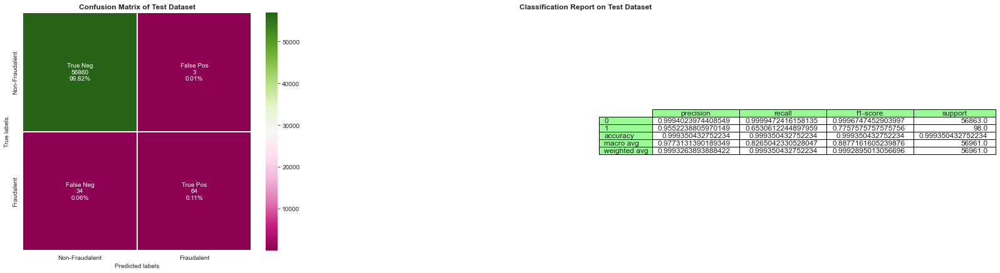

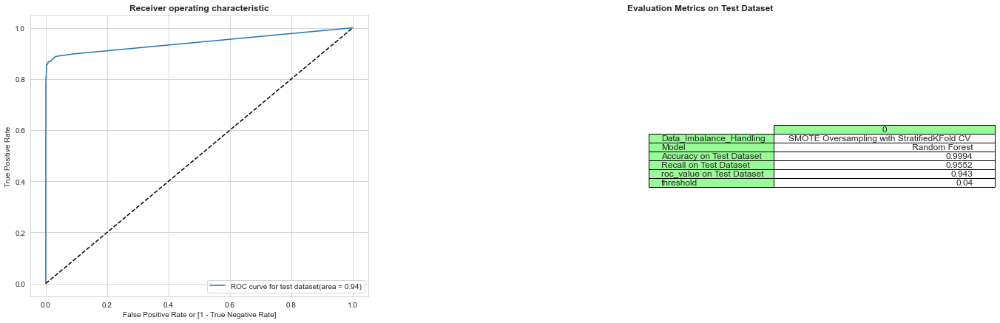

Time Taken by Random Forest Model: --- 536.1684985160828 seconds ---


In [112]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results, Data_Imbalance_Handling, X_train_Smote, y_train_Smote , X_test, y_test)

XGBoost Model


C:\Users\User\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:17:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


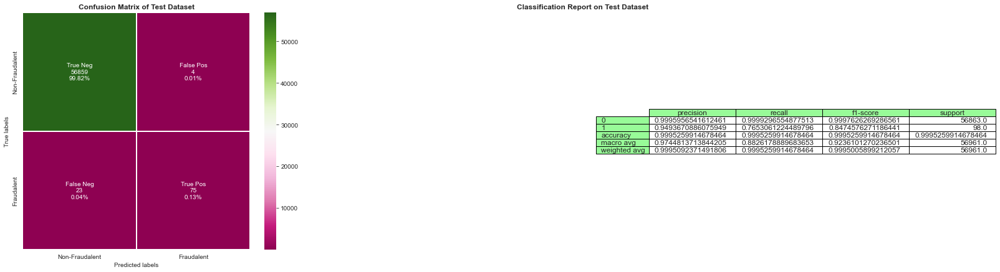

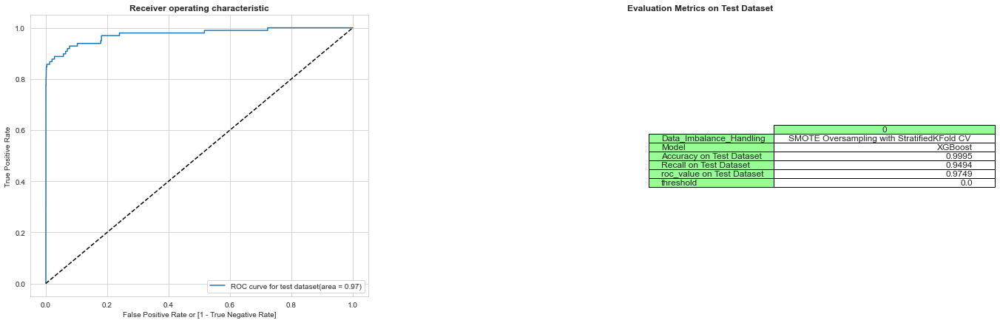

Time Taken by XGBoost Model: --- 255.56110882759094 seconds ---


In [113]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results, Data_Imbalance_Handling, X_train_Smote, y_train_Smote , X_test, y_test)

In [ ]:
# Run SVM Model with Sigmoid Kernel
# print("SVM Model with Sigmoid Kernel")
# start_time = time.time()
# df_Results = buildAndRunSVMModels(df_Results, Data_Imbalance_Handling, X_train_Smote, y_train_Smote , X_test, y_test)
# print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))

In [114]:
df_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7681,0.9662,0.0010
0,Logistic Regression with L1 Regularization,Power Transformer,0.9989,0.7385,0.9629,0.0091
0,KNN,Power Transformer,0.9993,0.8434,0.9008,0.2000
0,Tree model with gini criteria,Power Transformer,0.9990,0.6931,0.8643,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9990,0.6939,0.8539,1.0000
0,Random Forest,Power Transformer,0.9994,0.9067,0.9303,0.0200
0,XGBoost,Power Transformer,0.9995,0.9114,0.9759,0.0001
0,SVM,Power Transformer,0.9986,0.5743,0.8919,0.0014
0,Logistic Regression with L2 Regularization,RepeatedKFold Cross Validation,0.9992,0.9273,0.9782,0.0018
0,Logistic Regression with L1 Regularization,RepeatedKFold Cross Validation,0.9992,0.9123,0.9347,0.0253


Results for SMOTE Oversampling:
Looking at Recall and ROC value we have Random Forest which has provided best results for SMOTE oversampling technique

# Model building - imbalanced handled by ADASYN Oversampling

We will use ADASYN Oversampling method to handle the class imbalance
1. First we will display class distibution with and without the ADASYN Oversampling. 
2. Then We will use the oversampled with StratifiedKFold cross validation method to genearte Train And test datasets.

Once we have train and test dataset we will feed the data to below models:
1. Logistic Regression with L2 Regularisation 
2. Logistic Regression with L1 Regularisation 
3. KNN 
4. Decision tree model with Gini criteria 
5. Decision tree model with Entropy criteria 
6. Random Forest 7. XGBoost 8. SVM Model We did try SVM (support vector Machine) model , but due to extensive processive power requirement we avoided useing the model.
Once we get results for above model, we will compare the results and select model which provided best results for the Random oversampling techinique

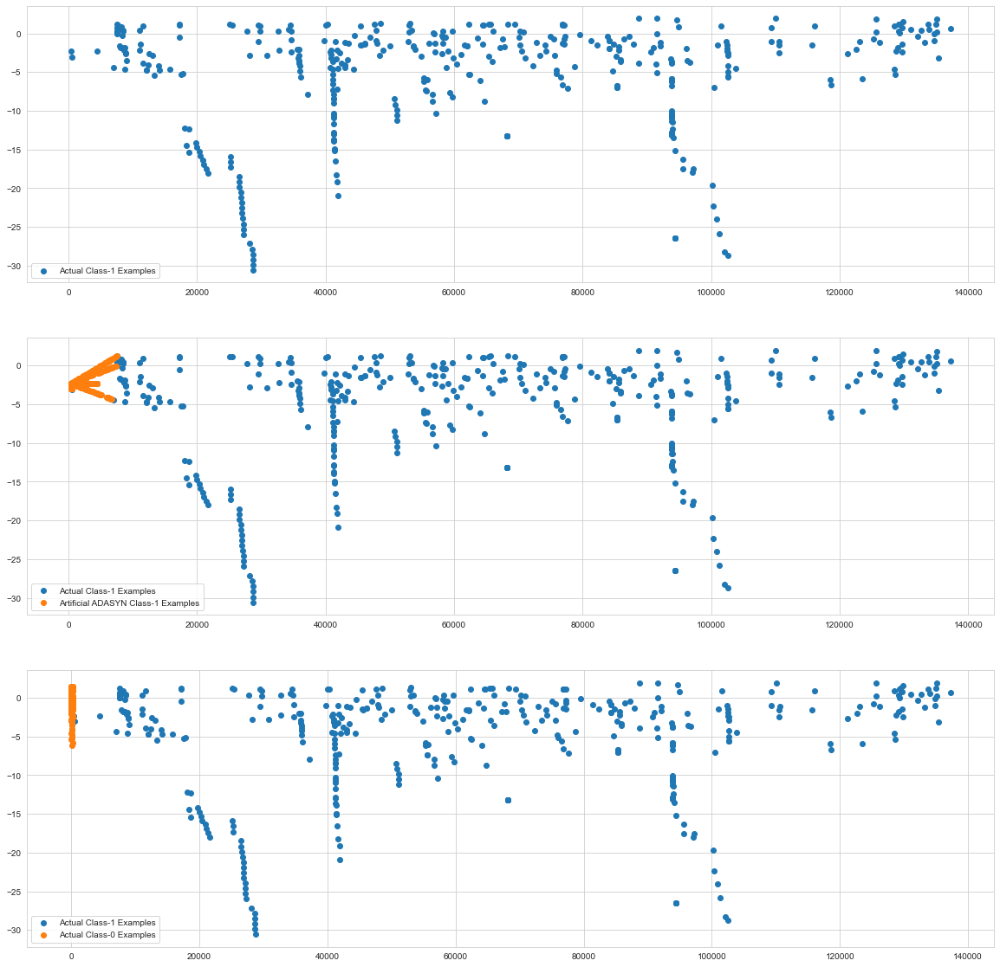

In [115]:
ADASYN_over = ADASYN(random_state=0)
X_train_ADASYN, y_train_ADASYN = ADASYN_over.fit_resample(X_train, y_train) 

# Artificial minority samples and corresponding minority labels from ADASYN are appended
# below X_train and y_train respectively
# So to exclusively get the artificial minority samples from ADASYN, we do
X_train_adasyn_1 = X_train_ADASYN[X_train.shape[0]:]

X_train_1 = X_train.to_numpy()[np.where(y_train==1.0)]
X_train_0 = X_train.to_numpy()[np.where(y_train==0.0)]


plt.rcParams['figure.figsize'] = [20, 20]
fig = plt.figure()

plt.subplot(3, 1, 1)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 2)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_adasyn_1.iloc[:X_train_1.shape[0], 0], X_train_adasyn_1.iloc[:X_train_1.shape[0], 1],
            label='Artificial ADASYN Class-1 Examples')
plt.legend()

plt.subplot(3, 1, 3)
plt.scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], 0], X_train_0[:X_train_1.shape[0], 1], label='Actual Class-0 Examples')
plt.legend()

In [116]:
skf = StratifiedKFold(n_splits=5, random_state=None)

for fold, (train_index, test_index) in enumerate(skf.split(X,y), 1):
    X_train = X.loc[train_index]
    y_train = y.loc[train_index] 
    X_test = X.loc[test_index]
    y_test = y.loc[test_index]  
    SMOTE_adasyn = SMOTE(random_state=0)
    X_train_ADASYN, y_train_ADASYN= ADASYN_over.fit_resample(X_train, y_train)

X_train_ADASYN = pd.DataFrame(data=X_train_ADASYN, columns=cols) # Create Dataframe for X_over

Logistic Regression with L1 And L2 Regularisation


C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\User\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line searc

Parameters for L2 regularisations: 
[[-1.63034888e-05  1.76888971e+00  1.50564973e+00  1.00227020e+00
   8.81398271e-01  1.53165251e+00 -1.06807243e+00 -1.84797882e+00
  -3.21657318e-01 -1.06541031e+00 -1.95977382e+00  6.36886392e-01
  -1.75120987e+00 -4.86451340e-01 -2.05785848e+00 -2.18681075e-01
  -1.16376326e+00 -1.85394650e+00 -6.69193257e-01  8.33088504e-01
  -2.50255823e+00  5.78564572e-02  1.13326326e+00  1.49164224e+00
  -4.58775439e-01  1.06863340e-01  1.68476662e-01 -1.57959578e+00
   1.03010839e+00  2.04139076e-02]]
[-5.89132366]


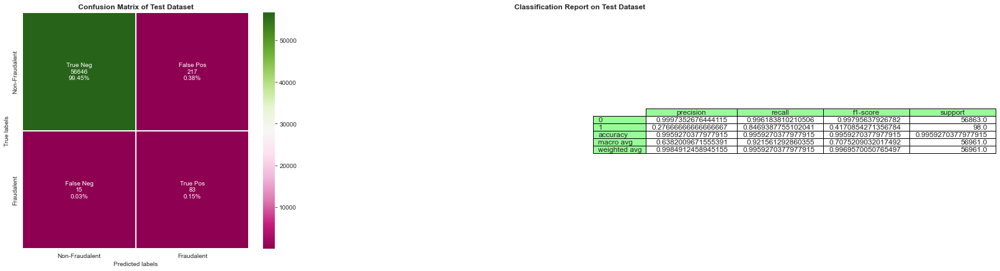

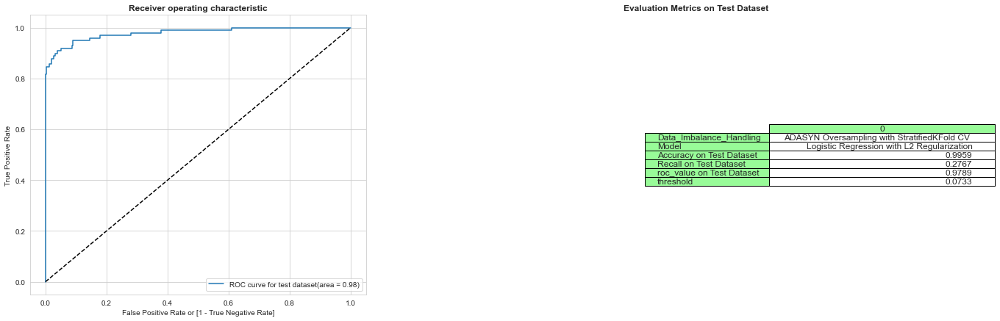

Time Taken by Logistic Regression/L2 RegModel: --- 3442.5337975025177 seconds ---
Parameters for l1 regularisations: 
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


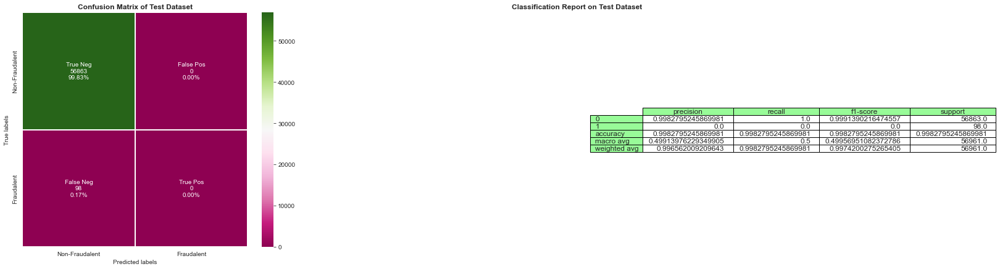

C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


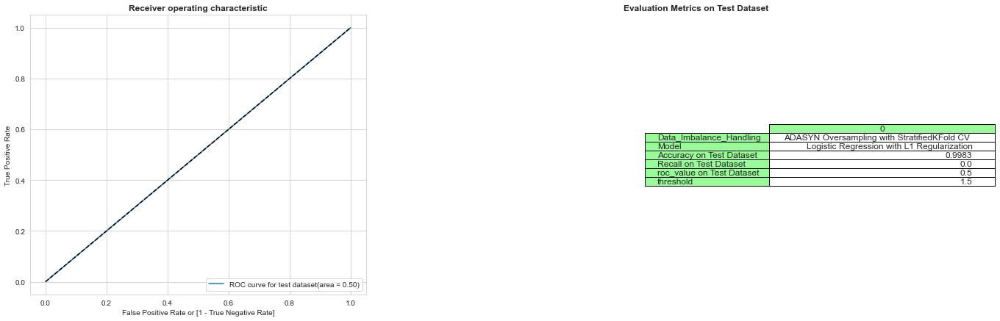

Time Taken by Logistic Regression/L1 RegModel: --- 3547.2441885471344 seconds ---


In [117]:
Data_Imbalance_Handling = "ADASYN Oversampling with StratifiedKFold CV "
#Run Logistic Regression with L1 And L2 Regularisation
print("Logistic Regression with L1 And L2 Regularisation")
df_Results = buildAndRunLogisticModels(df_Results, Data_Imbalance_Handling, X_train_ADASYN, y_train_ADASYN , X_test, y_test)

KNN Model


C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


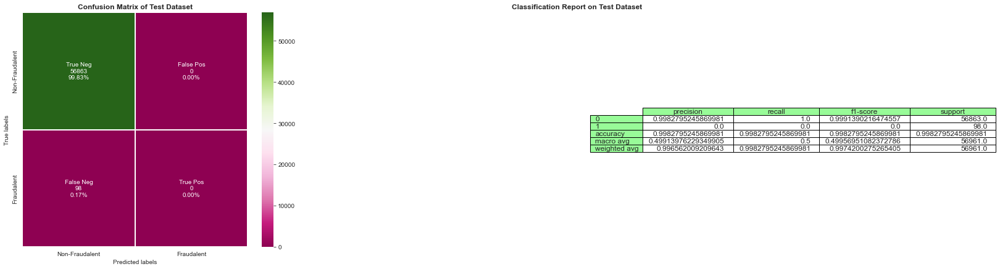

C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


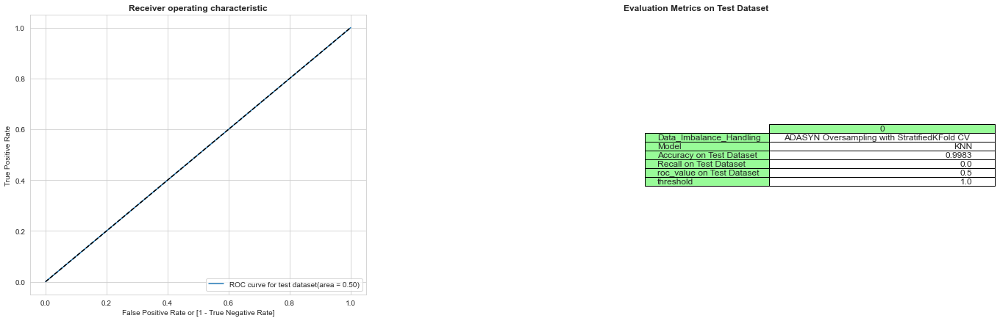

Time Taken by KNN Model: --- 1830.2831499576569 seconds ---


In [118]:
#Run KNN Model
print("KNN Model")
df_Results = buildAndRunKNNModels(df_Results, Data_Imbalance_Handling,X_train_ADASYN, y_train_ADASYN , X_test, y_test)

Decision Tree Models with  'gini' & 'entropy' criteria


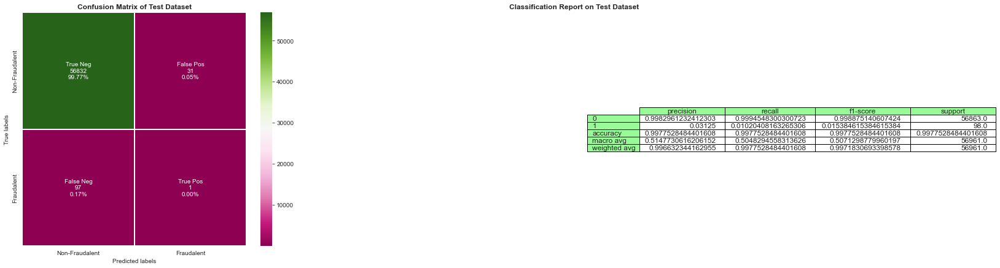

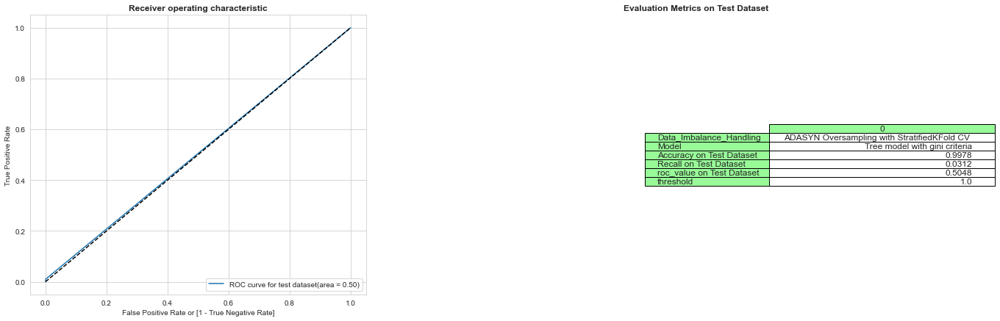

Time Taken by Tree Model with gini criteria: --- 66.42699241638184 seconds ---


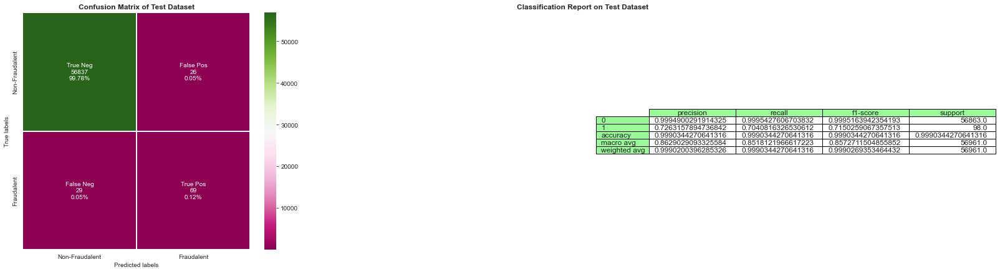

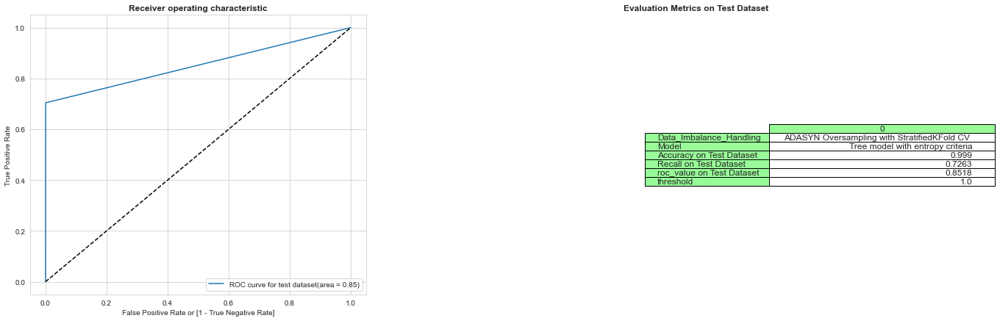

Time Taken by Tree Model with entropy criteria: --- 40.99622058868408 seconds ---


In [119]:
#Run Decision Tree Models with  'gini' & 'entropy' criteria
print("Decision Tree Models with  'gini' & 'entropy' criteria")
df_Results = buildAndRunTreeModels(df_Results, Data_Imbalance_Handling,X_train_ADASYN, y_train_ADASYN , X_test, y_test)

Random Forest Model


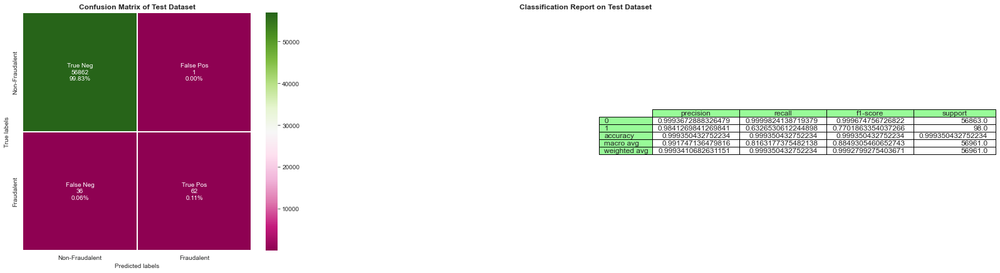

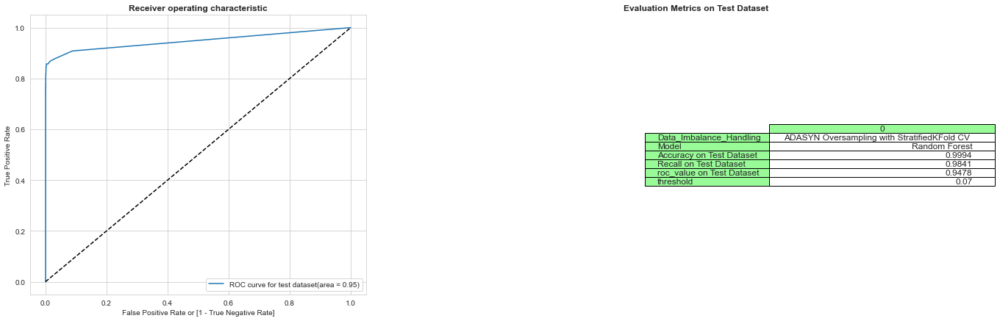

Time Taken by Random Forest Model: --- 526.5571556091309 seconds ---


In [120]:
#Run Random Forest Model
print("Random Forest Model")
df_Results = buildAndRunRandomForestModels(df_Results, Data_Imbalance_Handling,X_train_ADASYN, y_train_ADASYN , X_test, y_test)

XGBoost Model


C:\Users\User\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:07:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


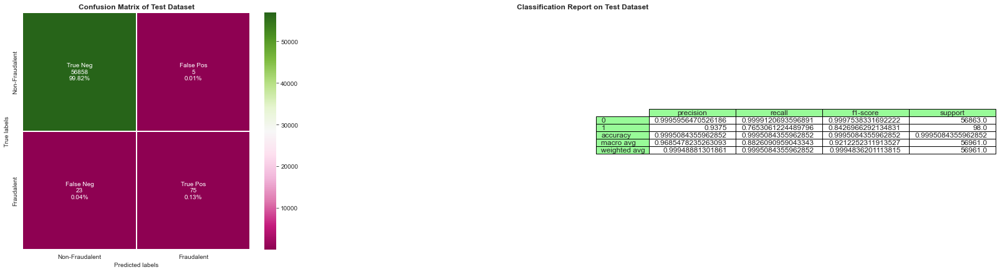

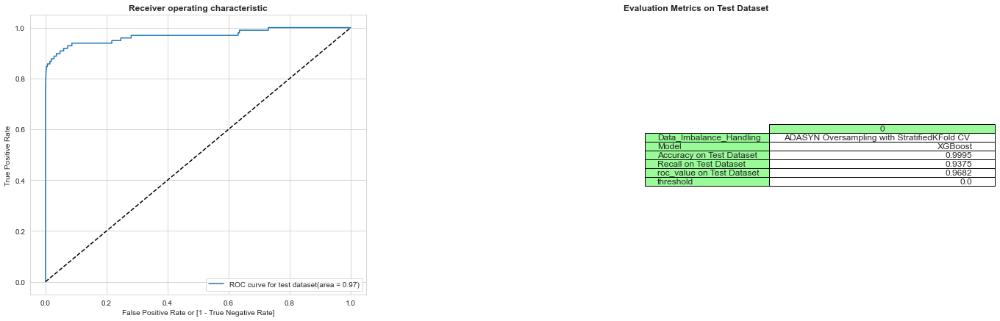

Time Taken by XGBoost Model: --- 272.41151452064514 seconds ---


In [121]:
#Run XGBoost Model
print("XGBoost Model")
df_Results = buildAndRunXGBoostModels(df_Results, Data_Imbalance_Handling,X_train_ADASYN, y_train_ADASYN , X_test, y_test)

In [122]:
df_Results

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,Power Transformer,0.9990,0.7681,0.9662,0.0010
0,Logistic Regression with L1 Regularization,Power Transformer,0.9989,0.7385,0.9629,0.0091
0,KNN,Power Transformer,0.9993,0.8434,0.9008,0.2000
0,Tree model with gini criteria,Power Transformer,0.9990,0.6931,0.8643,1.0000
0,Tree model with entropy criteria,Power Transformer,0.9990,0.6939,0.8539,1.0000
0,Random Forest,Power Transformer,0.9994,0.9067,0.9303,0.0200
0,XGBoost,Power Transformer,0.9995,0.9114,0.9759,0.0001
0,SVM,Power Transformer,0.9986,0.5743,0.8919,0.0014
0,Logistic Regression with L2 Regularization,RepeatedKFold Cross Validation,0.9992,0.9273,0.9782,0.0018
0,Logistic Regression with L1 Regularization,RepeatedKFold Cross Validation,0.9992,0.9123,0.9347,0.0253


Results for ADASYN Oversampling:
Looking at Recall and ROC value we have XGBoost and Random forest which have provided best results for ADASYN oversampling technique

 # Final Model Selection:

In [127]:
df_Results.sort_values(['roc_value on Test Dataset', 'Recall on Test Dataset'], ascending=[False, False])

,Model,Data_Imbalance_Handling,Accuracy on Test Dataset,Recall on Test Dataset,roc_value on Test Dataset,threshold
0,Logistic Regression with L2 Regularization,StratifiedKFold Cross Validation,0.9987,0.9643,0.9842,0.0015
0,Logistic Regression with L2 Regularization,Random Oversampling with StratifiedKFold CV,0.9950,0.2386,0.9825,0.1646
0,Logistic Regression with L2 Regularization,Random Oversampling with StratifiedKFold CV,0.9949,0.2346,0.9824,0.2367
0,Logistic Regression with L2 Regularization,SMOTE Oversampling with StratifiedKFold CV,0.9963,0.2996,0.9789,0.0709
0,Logistic Regression with L2 Regularization,ADASYN Oversampling with StratifiedKFold CV,0.9959,0.2767,0.9789,0.0733
0,XGBoost,Random Undersampling,0.9886,0.1147,0.9789,0.0936
0,Random Forest,Random Undersampling,0.9923,0.1566,0.9784,0.3000
0,Logistic Regression with L2 Regularization,RepeatedKFold Cross Validation,0.9992,0.9273,0.9782,0.0018
0,XGBoost,Random Oversampling with StratifiedKFold CV,0.9995,1.0000,0.9769,0.0000
0,XGBoost,RepeatedKFold Cross Validation,0.9996,0.9452,0.9767,0.0000
